<h1><span style="color:#45b39d"> BREAST CANCER DIAGNOSTIC ANALYSIS</span></h1>

**Student**: Marina D'Amato - s267566

# Introduction

The application of Machine Learning techniques in the healthcare sector is spreading recently. In fact, the large amount of data at disposal requires a sophisticated data analysis pipeline in order to be able to extract meaningful knowledge and information from them. 

Among the different types of applications, in this work we focus on **breast cancer diagnosis**. Breast cancer is one of the most common disease and it is the second leading cause of cancer death among women. Detecting the disease in the early stages improves the chance of survival significantly: for this reason, the automated analysis of these data by means of data mining techniques is the best methodology to adopt in order to infer relationships between the features of cancer and its diagnosis.

Before performing the classification task, we present and explore the dataset and adopt the necessary preprocessing steps to clean the data and make them valuable for the classifier. Then, different machine learning techniques are adopted and compared: for each of them, a short mathematical overview is provided. Finally, all the results are compared and discussed. 

In [1]:
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Show/hide code</button>''', raw=True)

Show/hide code

In [76]:
import seaborn as sns
sns.set()

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

import plotly.express as px
import plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.ensemble import IsolationForest, RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.decomposition import PCA
from sklearn.neighbors import LocalOutlierFactor
from sklearn.linear_model import LogisticRegression
from plotly.offline import iplot, init_notebook_mode
from sklearn import preprocessing
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC, OneClassSVM
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, ParameterGrid, GridSearchCV
from sklearn.metrics import classification_report, f1_score, accuracy_score, make_scorer, confusion_matrix
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline, make_pipeline
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import StratifiedKFold

In [4]:
def configure_plotly_browser_state():
    import IPython
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [5]:
from IPython.display import Image

di.display_html("""

<style>
#summary {
  font-family: "Trebuchet MS", Arial, Helvetica, sans-serif;
  border-collapse: collapse;
  width: 100%;
}

#summary td, #summary th {
  border: 1px solid #ddd;
  padding: 8px;
  text-align: center;
}


#summary th {
  padding-top: 12px;
  padding-bottom: 12px;
  text-align: center;
  
  color: white;
}

.first{
    background-color: #45b39d;
    font-size:20px;
}
.second{
    background-color: #f5eef8 ;
}

.third{
    background-color: #fdedec ;
    color: white;
}

#summary a {
    color: black;
    padding: 10px 20px;
    text-align: center;
    text-decoration: none;
        text-decoration-line: none;
        text-decoration-style: solid;
        text-decoration-color: currentcolor;
        text-decoration-thickness: auto;
    display: inline-block;
    font-size: 16px;
    margin-left: 20px;
    
}

</style>

""", raw=True)

In [6]:
di.display_html("""
<table id="summary">
    <thead class="first">
        <th colspan=5>CONTENTS</th>
    <tbody>
        <tr>
            <td colspan=5 class="cell"><a href='#Data-description'>Data description</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Data-exploration'>Data exploration</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Normality-test'>Normality test</a></td>
        </tr>
        <tr>
            <td td colspan=2 class="cell"><a href='#D'Agostino's-K-squared-Test'>D'Agostino's K-squared test</a></td>
            <td td colspan=1 class="cell"></td>
            <td td colspan=2 class="cell"><a href='#Shapiro-Wilk-Test'>Shapiro-Wilk test</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Features-correlation'>Features correlation</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Label-encoding-and-outliers'>Outliers detection</a></td>
        </tr>
        <tr>
            <td td colspan =1 class="cell"><a href='#Z-score'>Z-score</a></td>
            <td td colspan =1 class="cell"></td>
            <td td colspan =1 class="cell"><a href='#Isolation-Forest'>Isolation Forest</a></td>
            <td td colspan =1 class="cell"></td>
            <td td colspan =1 class="cell"><a href='#Local-Outlier-Factor'>Local Outlier Factor</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Feature-analysis-and-visualization'>Feature analysis and visualization</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Dimensionality-reduction'>Dimensionality reduction</a></td>
        </tr>
        <tr>
            <td td colspan=2 class="cell"><a href='#Principal-Component-Analysis'>PCA</a></td>
            <td td colspan =1 class="cell"></td>
            <td td colspan=2 class="cell"><a href='#Linear-Discriminant-Analysis'>LDA</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Manage-dataset-imbalancing'>Manage dataset imbalancing</a></td>
        </tr>
        <tr>
            <td td colspan=2 class="cell"><a href='#Undersampling'>Undersampling</a></td>
            <td td colspan =1 class="cell"></td>
            <td td colspan=2 class="cell"><a href='#Oversampling-(SMOTE)'>SMOTE</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Cross-Validation'>Cross Validation</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Classification-algorithms'>Classification algorithms</a></td>
        </tr>
        <tr>
            <td class="cell"><a href='#Decision-Tree'>Decision Tree</a></td>
            <td class="cell"><a href='#Random-Forest'>Random Forest</a></td>
            <td class="cell"><a href='#Boosting-&-AdaBoost'>Boosting & AdaBoost</a></td>
            <td class="cell"><a href='#Linear-SVM'>Support Vector Machine</a></td>
            <td class="cell"><a href='#Logistic-Regression'>Logistic Regression</a></td>
        </tr>
        <tr>
            <td colspan=5 class="cell"><a href='#Conclusions'>Conclusions</a></td>
        </tr>
    </tbody>
</table>
""", raw=True)

CONTENTS 
 
 
 Data description 
 
 
 Data exploration 
 
 
 Normality test 
 
 
 D'Agostino's K-squared test 
 
 Shapiro-Wilk test 
 
 
 Features correlation 
 
 
 Outliers detection 
 
 
 Z-score 
 
 Isolation Forest 
 
 Local Outlier Factor 
 
 
 Feature analysis and visualization 
 
 
 Dimensionality reduction 
 
 
 PCA 
 
 LDA 
 
 
 Manage dataset imbalancing 
 
 
 Undersampling 
 
 SMOTE 
 
 
 Cross Validation 
 
 
 Classification algorithms 
 
 
 Decision Tree 
 Random Forest 
 Boosting & AdaBoost 
 Support Vector Machine 
 Logistic Regression 
 
 
 Conclusions

# Data description

The dataset used in this work is the [**Breast Cancer Wisconsin (Diagnostic) Dataset**](https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29), which is one of the mostly exploited for this application. It consists of **569 instances** of which 357 instances are **benign** and 212 are **malignant cases**. The **32 features** are obtained from a digitized image of a fine needle aspiration (FNA), which is one of the most used technique to detect cancer in early stages. They resume characteristics of the cell nuclei represented in the scanned images. 

The first column of the dataset corresponds to the _patient ID_ and the second represents the _diagnosis_ \: "M" stands for malignant and "B" for benign. The other 30 real-value attributes are obtained computing the _mean_ , the _standard error_ and the _worst_ (mean of the three largest values) of ten features, which are the following ones:


* radius (mean of distances from center to points on the perimeter)
* texture (standard deviation of gray-scale values)
* perimeter
* area
* smoothness (local variation in radius lengths)
* compactness (perimeter^2 / area - 1.0)
* concavity (severity of concave portions of the contour)
* concave points (number of concave portions of the contour)
* symmetry
* fractal dimension (“coastline approximation” - 1)




In [7]:
di.display_html("""
<center><img src="https://www.researchgate.net/profile/Glaucia_Sizilio/publication/232811011/figure/fig3/AS:214220353347586@1428085520095/Captured-images-of-layers-of-glass-with-smears-of-breast-mass-obtained-by-FNA-the-parts.png"></center>
""", raw=True)

# Data exploration

The first part of our analysis consists in exploring data in order to extract meaningful information before applying the models. Data exploration allows us to detect missing values, inconsistencies in data and to analyze the type of each predictor. 

We load the dataset and we drop the 'id' column since it is not influential for the analysis. Our goal is to predict the malignity or benignity of a breast cancer given some characteristics related to the cells in the breast tissue. It is easy to understand that the information which refers to the identification of the patients are not useful for the model.

The summary below shows that the dataset is now composed by 569 instances and 31 features: all the features are **numerical**, except for our response variable _diagnosis_ which is **categorical**. 

In [8]:
data = pd.read_csv('./breastcancer.csv')
data2 = pd.read_csv('./breastcancer.csv')
data.drop(['id', 'Unnamed: 32'], axis = 1, inplace = True)
data

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


**Missing values** <br>
An important step of data exploration includes the detection of missing values. Possible solutions for this type of problem consists in deleting completely the entries which contain the missing value, estimating its value or replacing it with the mean of all the other values associated to that feature. <br>
As we can see below, in this case the dataset does not contain any missing value so we should not worry about dropping instances or replacing values.

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

**Basic statistics**

Another step of data exploration is the analysis of some basic statistical details of our dataset, such as:

* **Sample mean**:
\begin{equation}
\bar{X} = {1 \over N} \sum_{i=1}^N X_i 
\end{equation}

* **Sample standard deviation**:
\begin{equation}
S = \sqrt{{1 \over N-1} \sum_{i=1}^N (X_i - \bar{X})^2}
\end{equation}

* The **min** and the **max** value for each predictor

* The **lower percentile** (25%), the **median** (50%) and the **upper percentile** (75%)

Observing these results, we can notice that the predictors have a very different range of values. For instance, the maximum value of _area mean_ is 2501, while that of _smoothness mean_ is 0.163400. This suggests that we need to normalize our data before visualization, feature selection and classification. 
Moreover, we can detect problematic features in terms of outliers and values too far from the estimated mean. 

All these issues are addressed properly in the following sections: <a href='#Standardization'>Standardization</a> and <a href='#Label-encoding-and-outliers'>Label enconding and outliers</a>.

In [10]:
data.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


We can also analyze the mean values for each feature, dividing the results between the two classes: benign and malign tumors. In this way, we can observe the differences between the two types of tumors and we can start to understand which predictors are most useful for our classification analysis. 

For instance, we can observe that malign tumors are characterized by cells which are bigger and have perimeters and areas above the normal size.

In [11]:
data.groupby('diagnosis').mean()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
B,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442
M,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530


## Count plot

The first thing we can notice is that the dataset is slightly **unbalanced**. The count plow below shows that the number of benign cases is much higher with respect to the malignant ones. Many machine learning classifiers are sensitive to unbalanced data and we should be careful, especially in healthcare where the diagnosis prediction affect significatively people's lives. For this reason, later we will consider different techniques to rebalance the data.

Number of cells diagnosed Benign : 357
Number of cells diagnosed Malignant : 212


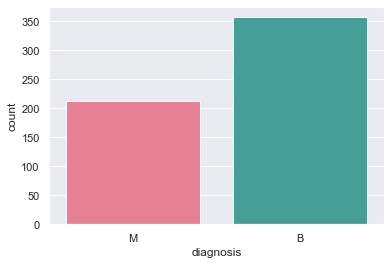

In [12]:
benign, malignant = data.diagnosis.value_counts()
print("Number of cells diagnosed Benign : {}".format(benign))
print("Number of cells diagnosed Malignant : {}".format(malignant))

ax = sns.countplot(x="diagnosis", data=data, palette='husl')

data_m = data[data.diagnosis == "M"]
data_b = data[data.diagnosis == "B"]

In [13]:
import plotly.express as px
configure_plotly_browser_state()
init_notebook_mode(connected=False)

fig = px.pie(data, names='diagnosis', title='Distribution', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

# Normality test

In machine learning there are algorithms which require, as a condition, that the data are normally distributed. For this reason, it is interesting to see whether our numerical predictors come from a normal distribution or not. To do so we perform two different kind of tests to check if we should accept or reject our hypothesis: 

* **Null hypothesis H0**: the features has a normal distribution
* **Alternative hypothesis H1**: the features has not a normal distribution

We are seeking results with a larger p-value to confirm that our sample was likely drawn from a Gaussian distribution.

## D'Agostino's K-squared Test

The D'Agostino's K-squared test is based on the computation of two measures: 
* **skewness**: measure of the **asimmetry** of the probability distribution of a random variable about its mean.
The skewness can have positive, negative or even zero value in case of perfectly simmetric data, such as data that are normally distributed. Negative values indicate that data are _skewed left_ , thus meaning that the left tail is longer than the right one; on the other hand, _skewed right_ means that the right tail is longer than the left one. 


In [14]:
di.display_html("""
<center><img src="https://upload.wikimedia.org/wikipedia/commons/thumb/f/f8/Negative_and_positive_skew_diagrams_%28English%29.svg/669px-Negative_and_positive_skew_diagrams_%28English%29.svg.png" width=500px></center>
""", raw=True)

The sample skewness can be computed as follows: 

\begin{equation}
skewness = {{{1 \over n} \sum_{i=1}^N (x_i - \bar{x})^3} \over {{({1 \over n} \sum_{i=1}^N (x_i - \bar{x})^2})^{3 \over 2}}}
\end{equation}

* **kurtosis**: measure of the "tailedness" of the probability distribution of a real-valued random variable. It quantifies how much of the distribution is in the tail. The kurtosis of a normal distribution equals 3: we can also say that normally distributed data have a Mesokurtic distribution. On the other hand, if we have a positive excess distribution then we refer to a Platykurtic distribution, while if we have a negative excess distribution we refer to a Leptokurtic distribution.

In [15]:
di.display_html("""
<center><img src="https://prepnuggets.com/wp-content/uploads/2019/12/Kurtosis.jpg" width=500px></center>
""", raw=True)

The sample kurtosis can be computed as follows:

\begin{equation}
kurtosis = {{{1 \over n} \sum_{i=1}^N (x_i - \bar{x})^4} \over {{({1 \over n} \sum_{i=1}^N (x_i - \bar{x})^2})^2}}-3
\end{equation}

As we can see, we are interested in measuring the excess kurtosis, which computes the difference between the kurtosis of a distribution with respect to the kurtosis of a normal distribution, which is equal to 3.

## Shapiro-Wilk Test

The test statistic which refers to the Shapiro-Wilk test is:

\begin{equation}
W = ({\sum_{i=1}^N a_ix_{(i)}})^2 \over {\sum_{i=1}^N (x_i - \bar x)^2}
\end{equation}

where $x_{(i)}$ is the i-th smallest number in the sample and $a_i$ are coefficients computed from normal distributions.

We can apply the two tests on our data, choosing a threshold value called $\alpha$ equals to 0.05, such that:

* if the p-value is less than alpha (p$\leq$$\alpha$) then we reject the null hypothesis
* if the p-value is greater than alpha (p$>$$\alpha$) then we accept the null hypothesis and we infer that the feature has a normal distribution

In [16]:
alpha = 0.05
result1 = []
result2 = []
for column in data.columns[1:]:
    
    k2, p1 = stats.normaltest(data.loc[:, column].values)
    stat, p2 = stats.shapiro(data.loc[:, column].values)
    result1.append(f"Reject H0: {column} is gaussian" if p1 <= alpha else f"Not reject H0: {column} is gaussian")
    result2.append(f"Reject H0: {column} is gaussian" if p2 <= alpha else f"Not reject H0: {column} is gaussian")
          
tests = pd.DataFrame(list(zip(data.columns[1:], result1, result2)), columns=['Feature', 'Results test 1', 'Results test 2']).set_index(['Feature'])
tests


,Results test 1,Results test 2
Feature,,
radius_mean,Reject H0: radius_mean is gaussian,Reject H0: radius_mean is gaussian
texture_mean,Reject H0: texture_mean is gaussian,Reject H0: texture_mean is gaussian
perimeter_mean,Reject H0: perimeter_mean is gaussian,Reject H0: perimeter_mean is gaussian
area_mean,Reject H0: area_mean is gaussian,Reject H0: area_mean is gaussian
smoothness_mean,Reject H0: smoothness_mean is gaussian,Reject H0: smoothness_mean is gaussian
compactness_mean,Reject H0: compactness_mean is gaussian,Reject H0: compactness_mean is gaussian
concavity_mean,Reject H0: concavity_mean is gaussian,Reject H0: concavity_mean is gaussian
concave points_mean,Reject H0: concave points_mean is gaussian,Reject H0: concave points_mean is gaussian
symmetry_mean,Reject H0: symmetry_mean is gaussian,Reject H0: symmetry_mean is gaussian


**We can conclude that our numerical features can not be considered as normally distributed.**

# Features correlation

It may happen that the features in a dataset are **highly correlated** with each others thus leading to overfitting and bad performances. Moreover, correlated features provide redundant information and could generate a **predictive bias**. We also know the problem called _curse of dimensionality_ caused by the fact that points in high dimensional spaces are more isolated and the probability to capture a point becomes small when the number of dimensions increases. Also, if two features are perfectly correlated, it means that one of them doesn't add additional information with respect to the other. 

For this reason, an important type of analysis consists in the features correlation which is based on the computation of the **Pearson's correlation coefficient** through the following formula: 
\begin{equation} \rho_{X,Y} = corr(X, Y) = \frac{cov(X, Y)}{\sigma_X\sigma_Y} = \frac{E[(X-\mu_X)(Y-\mu_Y)]}{\sigma_X\sigma_Y} \end{equation}

The coefficient is a measure of the strength of the association between two quantitative variables.

In [17]:
di.display_html("""
<center><img src="https://www.statisticshowto.com/wp-content/uploads/2012/10/pearson-2-small.png" width=500px></center>
""", raw=True)


It can have a value between -1 and 1, where:

* a correlation coefficient of 1 means that there is a **positive correlation** between the two variables, so for every positive increase in one variable, there is a positive increase of a fixed proportion in the other;
* a correlation coefficient of -1 means that there is a **negative correlation** between the two variables, so for every positive increase in one variable, there is a negative decrease of a fixed proportion in the other;
* a correlation coefficient of 0 means that the two variables are **not correlated** at all.

In order to study the correlations among the features of our dataset, we plot a correlation matrix visualized through a heat map, in which, according to the scale of color on the right, in each cell we represent the strongness of the relationship between each pair of features. 

<AxesSubplot:>

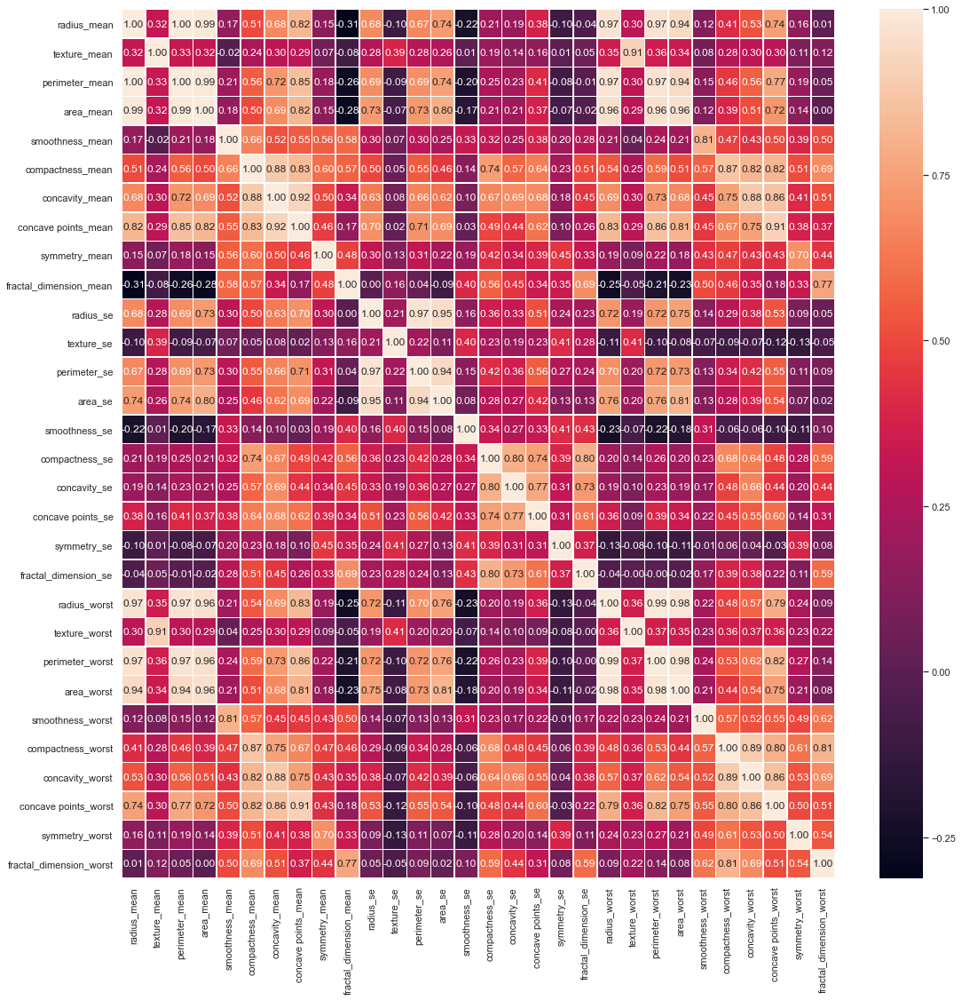

In [18]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(data.corr(), annot=True, linewidths=.5, fmt='.2f', ax=ax)

As it can be seen in the heatmap there are different features which have a very high correlation:
* *radius_mean*, *perimeter_mean* and *area_mean* are correlated with each other, so we could use only *radius_mean*
* *radius_se*, *perimeter_se* and *area_se* are correlated and we could use *radius_se*
* *radius_worst*, *perimeter_worst* and *area_worst* are correlated and we could drop all of them since they are correlated with *radius_mean*
* *texture_mean* and *texture_worst* are correlated so we could keep only the first feature
* *concavity_mean* and *concave points_worst* are correlated so we could drop the last feature

We consider as highly correlated the features characterized by a value greater than 0.9.

In [19]:
upper = data.corr().where(np.triu(np.ones(data.corr().shape), k=1).astype(np.bool))

to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
print(f"{len(to_drop)} features to drop: ", to_drop)

data_drop = data.drop(data[to_drop], axis=1)

10 features to drop:  ['perimeter_mean', 'area_mean', 'concave points_mean', 'perimeter_se', 'area_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'concave points_worst']


The scatterplot below shows the linear correlation between perimeter and radius and the quadratic correlation between radius and area.

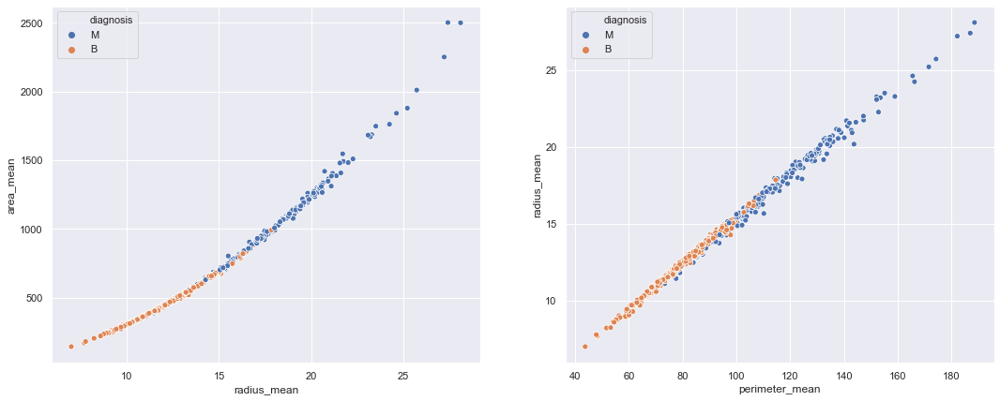

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7))
sns.scatterplot(x=data['radius_mean'], y=data['area_mean'], data=data, hue="diagnosis", ax=ax[0])
sns.scatterplot(x=data['perimeter_mean'], y=data['radius_mean'], data=data, hue="diagnosis", ax=ax[1])
plt.show()

However, we prefer not to discard features a priori and we keep all the 30 predictors. More accurate dimensionality reduction techniques will be performed in the next sections.

# Label encoding and outliers

In [21]:
data['diagnosis'] = data['diagnosis'].map({'M':0,'B':1})
data_drop['diagnosis'] = data_drop['diagnosis'].map({'M':0,'B':1})
data_drop
# 0: maligno - 1: benigno

,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,...,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
0,0,17.99,10.38,0.11840,0.27760,0.30010,0.2419,0.07871,1.0950,0.9053,...,0.04904,0.05373,0.01587,0.03003,0.006193,0.16220,0.66560,0.7119,0.4601,0.11890
1,0,20.57,17.77,0.08474,0.07864,0.08690,0.1812,0.05667,0.5435,0.7339,...,0.01308,0.01860,0.01340,0.01389,0.003532,0.12380,0.18660,0.2416,0.2750,0.08902
2,0,19.69,21.25,0.10960,0.15990,0.19740,0.2069,0.05999,0.7456,0.7869,...,0.04006,0.03832,0.02058,0.02250,0.004571,0.14440,0.42450,0.4504,0.3613,0.08758
3,0,11.42,20.38,0.14250,0.28390,0.24140,0.2597,0.09744,0.4956,1.1560,...,0.07458,0.05661,0.01867,0.05963,0.009208,0.20980,0.86630,0.6869,0.6638,0.17300
4,0,20.29,14.34,0.10030,0.13280,0.19800,0.1809,0.05883,0.7572,0.7813,...,0.02461,0.05688,0.01885,0.01756,0.005115,0.13740,0.20500,0.4000,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0,21.56,22.39,0.11100,0.11590,0.24390,0.1726,0.05623,1.1760,1.2560,...,0.02891,0.05198,0.02454,0.01114,0.004239,0.14100,0.21130,0.4107,0.2060,0.07115
565,0,20.13,28.25,0.09780,0.10340,0.14400,0.1752,0.05533,0.7655,2.4630,...,0.02423,0.03950,0.01678,0.01898,0.002498,0.11660,0.19220,0.3215,0.2572,0.06637
566,0,16.60,28.08,0.08455,0.10230,0.09251,0.1590,0.05648,0.4564,1.0750,...,0.03731,0.04730,0.01557,0.01318,0.003892,0.11390,0.30940,0.3403,0.2218,0.07820
567,0,20.60,29.33,0.11780,0.27700,0.35140,0.2397,0.07016,0.7260,1.5950,...,0.06158,0.07117,0.01664,0.02324,0.006185,0.16500,0.86810,0.9387,0.4087,0.12400


Outliers are data instances with characteristics that are considerably different from the rest of the dataset: they are observations that lie far away from the other values or from their center of mass. It is important to detect outliers since they can influence the estimation of the underlying distribution of our data. 

In the following, we analyze different methods for the outliers detection and in the end we choose the best one that fits better our goal. First of all, we should consider that the process of outliers detection can follow two methods:
* removing the outliers once for the entire dataset
* removing the outliers for each class

For the purpose of our analysis, we decide to follow the second methods. As seen before during the data exploration phase, we noticed that malign cells are characterized by values averagely greater than the benign ones. For this reason, it would not make any sense to remove the outliers for the entire dataset, since this could also imply the deletion of malign instances that, in fact, are not anomalous or inconsistent data but they just reflect the particular consequences of the tumor in the tissue. 

In [22]:
def remove_outliers(data, model=None):
    data_m = data[data.diagnosis == 0]
    data_b = data[data.diagnosis == 1]
    if model is not None:
        out_mal = model.fit_predict(data_m.drop('diagnosis', axis=1))
        out_ben = model.fit_predict(data_b.drop('diagnosis', axis=1))
        data_noout = pd.concat([data_m[out_mal == 1], data_b[out_ben == 1]])
    else:
        out_mal = data_m[(np.abs(stats.zscore(data_m.drop('diagnosis', axis=1))) < 3).all(axis=1)]
        out_ben = data_b[(np.abs(stats.zscore(data_b.drop('diagnosis', axis=1))) < 3).all(axis=1)]
        data_noout = pd.concat([out_mal, out_ben])
        
    number_outliers = data.groupby('diagnosis').size()-data_noout.groupby('diagnosis').size()
    percentage = number_outliers/data.groupby('diagnosis').size()*100
    stat = np.append(number_outliers, percentage)
    
    return data_noout, stat

## Z-score

Z-score is a measure that indicates how many standard deviations a data point is far from the sample's mean, in case of normal distribution. 
It is computed as follows:
\begin{equation} Z_{score} = \frac{(X - \bar X)}{S} \end{equation}
The usual way to detect outliers following this method consists in defining a threshold such that every observation above or under that specific value is considered unusual so is descarded. A standard cut-off value used also for this application is a Z-score of 3 (in absolute value). 

However, as displayed before in the <a href='#Normality-test'>Normality test</a> section, our features cannot be considered as normally distributed, so this method is not reliable. Moreover, the results below show that the Z-score method tends to remove a high number of malign instances, which can affect badly our analysis. 


In [23]:
data_noout_zs, stat_zs = remove_outliers(data)

## Isolation Forest

Isolation Forest is an unsupervised learning algorithm that belongs to the **ensemble decision trees** family. This method is different from others outlier detection methods which usually consist in finding the region of data that can be considered as "normal" and in classifying as outliers all the points that lie outside that region. On the other side, Isolation Forest does not identify a normal region, but it explicitly isolates anomalous points in the dataset. 

As stated in the paper _Isolation Forest_ this method is based on two properties of numerical outliers:
* **Few**: anomalies are the minority data points
* **Different**: they have attribute-values that are very different from those of normal instances

Because of these assumptions, outliers are susceptible to be isolated and this makes them fall closer to the root of the tree, while normal points are usually isolated at the deeper end of the tree. 

The main idea behind this method consists in building an ensemble of Isolation Trees ( _iTrees_ ) for a given dataset and then anomalies are the points that have shorter average path lengths on the iTrees. 

> When a forest of random trees collectively produce shorter path lengths for some particular points, then they are highly likely to be anomalies.

To build a tree the algorithm recursively generates partitions on the sample by selecting a random feature $q$ and a random splitting value $p$ (which is between the minimum and maximum values allowed for that feature). This procedure ends when the node has only one instance or when all data at the node have the same values. 

The goal of the algorithm is to assign a ranking to each node in terms of anomaly. The data points are sorted according to their path length or their anomaly score:

* **Path length**: for a point x, is number of edges that 𝑥 traverses an iTree from the root to an external node
* **Anomaly score**: computed as follows

\begin{equation} s(x,n) = 2^{-\frac{E[h(x)]}{c(n)}} \end{equation}
where $h(x)$ is the path length of the point x, $E[h(x)]$ is the expected value of the path length among all the trees and $c(n)$ is a normalization factor that represents the average of $h(x)$ given the size of the sample set.

A point is considered as outlier if his score is close to $1$, while if the score is smaller than $0.5$ then is likely to be a normal value.

In [24]:
di.display_html("""
<center><img src="https://pubs.rsc.org/image/article/2016/ay/c6ay01574c/c6ay01574c-f1_hi-res.gif" width=700px></center>
""", raw=True)


In [25]:
data_noout_if, stat_if = remove_outliers(data, IsolationForest())

## Local Outlier Factor

The Local Outlier Factor algorithm is an unsupervised anomaly detection method which computes the **local density deviation** of a given data point with respect to its neighbors. The concept of local density can be useful since the algorithm compares the local density of an object with the local density of its neighbors; then, we can check if the two regions have a similar density or if the selected point lie in a region with lower density and can be considered as an outlier.

We define the **k-distance** of a point $p$ as the distance of $p$ from its $k$-th nearest neighbor. We use this definition to compute the **reachability distance** which is the maximum between the distance of two points $p$ and $o$ and the $k$-th distance of the second point:

\begin{equation} \operatorname{reach-dist}_k(p, o) = \max \{ \operatorname{k-distance}(o), d(p, o) \} \end{equation}

In [26]:
di.display_html("""
<center><img src="https://miro.medium.com/max/408/1*zrk0QWDm7SXq2Iu69YnSFQ.png" width=400px></center>
""", raw=True)

In the example above, we can see that if a point $X_i$ lies within the $K$-neighbors of $X_j$, the reachability distance will be the $K$-distance of $X_j$ (blue line), else reachability distance will be the distance between $X_i$ and $X_j$ (orange line).

This concept is used to compute another quantity called **local reachability density**:

\begin{equation} \operatorname{lrd}_k(p) = 1/\left ( \frac{\sum_{o \in N_k(p)} \operatorname{reach-dist}_k(p, o) }{|N_k (p)|} \right ) \end{equation}

Local reachability density is the inverse of the average reachability distance of p from its neighbors. 

The idea behind this measure is that the longer the distance to the next neighbors, the sparser is the area the respective point is located in. It tells how far we have to travel from our point to reach the next point or cluster of points: the lower it is, the less dense it is, the longer we have to travel.

Finally the local reachability density is used to compute the **local outlier factor** which is defined as follows:
\begin{equation} \operatorname{LOF}_k(p) = \frac{\sum_{o \in N_k(p)} \frac{\operatorname{lrd}_k(o) }{\operatorname{lrd}_k(p) } }{|N_k(p)|} \end{equation}

and represents the average local reachability density of the neighbors divided by the object's own local reachability density. 

We can have the following situations as results:
* LOF $\sim$ $1$ $\rightarrow$ the point lies in a region with similar density as its neighbors
* LOF $<$ $1$ $\rightarrow$ the points lies in a denser region 
* LOF $>$ $1$ $\rightarrow$ the point lies in a lower density region, so it can be considered an outlier

In [27]:
data_noout_lof, stat_lof = remove_outliers(data, LocalOutlierFactor())

## Compare results

As we can see from the table below, the algorithm which is most useful for our application is **Isolation Forest**. The other algorithms tend to remove an high number of malignant instances and this could be risky for our further analysis, since these data are the ones that we are mostly interested in (and also, they are less than the benign instances).

For this reason, we proceed with our analysis using the reduced dataset which does not contain the data classified as outliers by the isolation forest algorithm. At this point, the total number of samples equals 518: 325 number of cells diagnosed as benign an

In [28]:
df = pd.DataFrame([stat_if, stat_lof, stat_zs], columns=[
    'Difference for class M', 
    'Difference for class B',
    'Percentage difference for class M',
    'Percentage difference for class B'
])

df['Algorithm'] = ['Isolation Forest', 'Local Outlier Factor', 'Z-score']
df = df.set_index('Algorithm')
df

,Difference for class M,Difference for class B,Percentage difference for class M,Percentage difference for class B
Algorithm,,,,
Isolation Forest,18.0,37.0,8.490566,10.364146
Local Outlier Factor,22.0,14.0,10.377358,3.921569
Z-score,29.0,41.0,13.679245,11.484594


# Standardization

Before visualizing and analyzing our features, firstly we need to standardize our data. Standardization is a very important technique, which allows to avoid inappropriate assignment of relevance: in fact, we don't want that a feature with a different domain is inappropriately considered as more relevant with respect to another one just because it has a higher range of values. Moreover, in order to perform PCA we need standardized data, because the algorithm gives emphasis to features according to their variance, so attributes should have the same scale.

Standardization is done according to the following formula:
\begin{align} z = \frac{x-\mu}{S} \end{align} 

In this way, we subtract from each value of each feature the mean of that feature and we divide the result by its standard deviation in order to obtain features with a unit scale, which means zero mean and unit variance.

In [29]:
def standardize(data):
    columns = [col for col in data.columns if col != 'diagnosis']
    scaler = preprocessing.StandardScaler().fit_transform(data.loc[:, columns])
    normalized = pd.DataFrame(scaler, columns=columns)
    normalized['diagnosis'] = data.reset_index()['diagnosis']
    return normalized

data_std_if = standardize(data_noout_if)    # data without outliers and 31 features
data_std_lof = standardize(data_noout_lof)    # data without outliers and 31 features
data_std_outliers = standardize(data)   # data with outliers and 31 features 

# Feature analysis and visualization

## Boxplot

In this section we use different kinds of visualization to have better insights of our dataset before building and comparing the models. In this way, we can understand the distribution of the features and the relations among them. In order to facilitate the visualization of the features, we decide to plot only the first ten attributes. As we have seen before, our 30 attributes can be divided into 3 groups, each containing 10 attributes that, in the end, are the same but corresponds to the respective mean, std and worst value. In general the trend of these three groups is quite similar.

The first type of visualization that we address is the **boxplot**. A boxplot is a type of chart which represents a five-number summary of data:
* **minimum score**: the lowest data, excluding outliers;
* **maximum score**: the largest data, excluding any outliers;
* **first quartile**: the twenty-fifth percentile;
* **median**: the middle value of a dataset;
* **third quartile**: the seventy-fifth percentile.

The **interquartile range** is the distance between the upper and the lower quartile and it contains the middle 50% of data points. 

In [30]:
di.display_html("""
<center><img src="https://www.simplypsychology.org/boxplot.jpg?ezimgfmt=rs:555x285/rscb24/ng:webp/ngcb24" width=400px></center>
""", raw=True)

Boxplots are useful because they also show outliers, as data that are outside the whiskers of the box (points above the maximum and below the minimum score). For this reason, it is interesting to compare the boxplots of our dataset before and after the outlier detection phase.

As we can see, the two plots are different since the first one is highly affected by the presence of outliers, while the distribution of the features is more stable after their detection and deletion. 

In [31]:
def boxplot(data):
    configure_plotly_browser_state()
    dataset2 = pd.melt(data, id_vars='diagnosis', var_name="features", value_name="value")

    fig = px.box(dataset2, x="features", y="value", color="diagnosis")
    fig.show(renderer="notebook")
    plotly.offline.init_notebook_mode(connected=True)

In [32]:
boxplot(data_std_outliers.iloc[:, list(range(10)) + [-1]])

In [33]:
boxplot(data_std_if.iloc[:, list(range(10)) + [-1]])

## Violin plots

Violin plots are similar to box plots with the addition of a kernel density plot on each side. They are useful to visualize the distribution of the predictors and also the distribution of each of them by class. In fact, in the following plots we can the overall distribution, but also the violin plots for each feature with the values divided by the benign and malignant cases.

In [34]:
def violinplot(data):
    import plotly.graph_objects as go
    configure_plotly_browser_state()

    fig = go.Figure()
    corr_dataset = pd.melt(data,id_vars='diagnosis',
                    var_name="features",
                    value_name='value')
    fig.add_trace(go.Violin(x=corr_dataset["features"][corr_dataset['diagnosis'] == 1],
                          y=corr_dataset["value"][corr_dataset['diagnosis'] == 1],
                          legendgroup='Benign', scalegroup='Yes', name='Benign cancer',
                          side='negative',
                          line_color='green')
              )
    fig.add_trace(go.Violin(x=corr_dataset["features"][corr_dataset['diagnosis'] == 0],
                          y=corr_dataset["value"][corr_dataset['diagnosis'] == 0],
                          legendgroup='Malignant', scalegroup='No', name='Malignant cancer',
                          side='positive',
                          line_color='red')
              )
    fig.update_traces(meanline_visible=True)
    fig.show(renderer="notebook")
    plotly.offline.init_notebook_mode(connected=True)

In [35]:
#violinplot(data_std_if.iloc[:, list(range(10)) + [-1]])

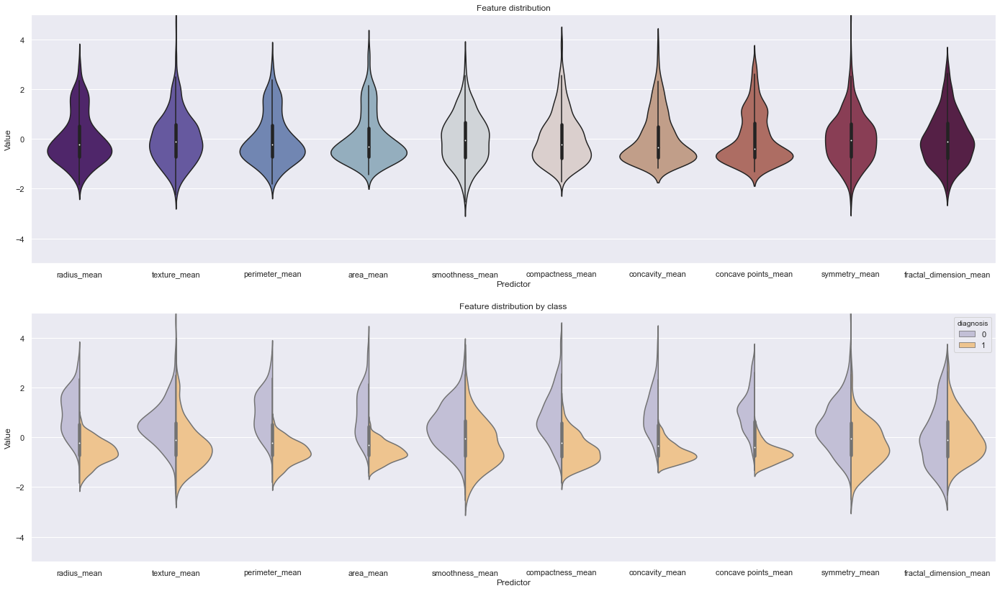

In [36]:
cols = [col for col in data_std_if.columns if "mean" in col]
melted_dataset = pd.melt(data_std_if, id_vars=['diagnosis'], value_vars=cols, var_name='Predictor', value_name='Value')

fig, ax = plt.subplots(2, 1, figsize=(24, 14))
sns.violinplot(data=data_std_if.iloc[:, 0:10], ax=ax[0], palette='twilight_shifted')
sns.violinplot(y='Value', x='Predictor', data=melted_dataset, split=True, hue='diagnosis', ax=ax[1], palette='PuOr_r')

ax[0].set_title('Feature distribution')
ax[0].set_xlabel('Predictor')
ax[0].set_ylabel('Value')
ax[0].set(ylim=(-5, 5))

ax[1].set_title('Feature distribution by class')
ax[1].set(ylim=(-5, 5))

plt.show()

## Pair plot

Pair plots are useful visualization tools that allow to see the distribution of single predictors but also the relationships between couples of them. 

The matrix contains, for each combination of predictors, a scatter plot that represents the distribution of the points among the two features divided by class. In this way we can easily visualize the linear and quadratic relationships which occur between correlated features, as alreay analyzed before. 

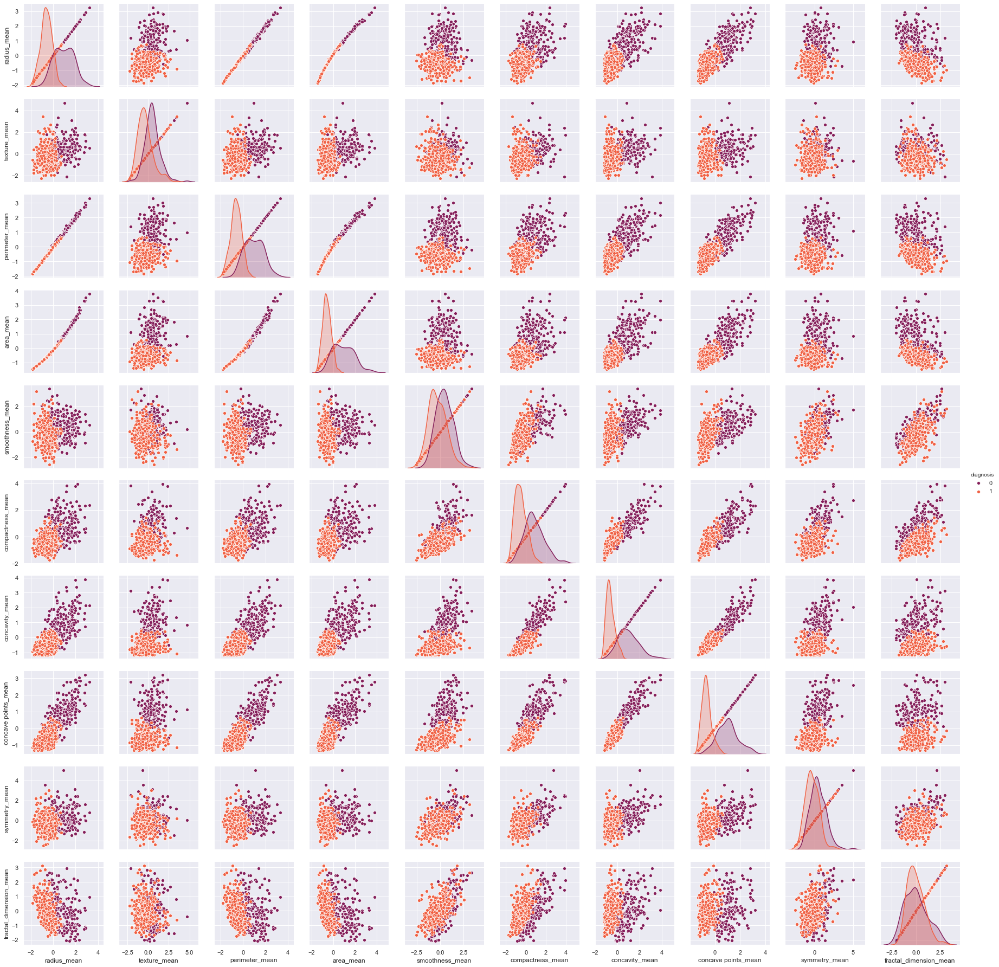

In [37]:
cols = data_std_if.columns
means = ['radius_mean', 'texture_mean', 'smoothness_mean', 'compactness_mean',
       'concavity_mean', 'symmetry_mean', 'fractal_dimension_mean', 'diagnosis']
se = ['radius_se', 'texture_se', 'smoothness_se', 'compactness_se',
       'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'diagnosis']
worst = ['smoothness_worst', 'compactness_worst',
       'concavity_worst', 'symmetry_worst', 'fractal_dimension_worst', 'diagnosis']

g = sns.pairplot(data=data_std_if.iloc[:, list(range(10)) + [-1]], hue='diagnosis', vars=data_std_if.columns[0:10], palette='rocket')
g = g.map(sns.scatterplot)

# Dimensionality reduction

One of the main challenge of machine learning is to find a better feature space in order to discard uninformative features and fix the problems derived from high dimensional data ( _curse of dimensionality_ ).

Some of the **problems** we can run into when having high dimensionality are the following ones:
* high **computational costs**
* **overfitting** and poor generalization: when we train our model on a high number of features, then the model tends to overfit because it starts to be strongly dependent on the data and shows lacks of generalization 
* lack of **interpretability**: for visualization purposes, it is better to deal with a subset of features

In our case we don't have any computational issue, but the exploratory analysis done so far shows that we are dealing with redundant and, in some cases, high correlated features. For this reason, we want to transform our data from a high-dimensional space into a low-dimensional space in such a way that the new feature space still preserves the meaningful properties.

There are two main approaches to dimensionality reduction:
* features selection
* features extraction

**Features selection** means that we select a subset of the original features without applying any transformation to the feature space. For example, as seen in <a href='#Features-correlation'>Features correlation</a> section, we can decide to drop all the features with a high correlation. In our analysis, this results to the deletion of 10 features. 

**Features extraction** _transforms_ the data from the high-dimensional space to a space of fewer dimensions by generating new features from the existing ones. In the following sections we address two main techniques for features extraction that apply linear transformations to reduce the dimensionality of our data: <a href='#Principal-Component-Analysis'>PCA</a> and <a href='#Linear-Discriminant-Analysis'>LDA</a>.

**Feature selection keeps a subset of the original features while feature extraction creates new ones.**


## Principal Component Analysis

The main goal of PCA is to reduce the dimensionality of data while preserving as much variability as possible, that means **preserving the information** in the data. It is an unsupervised learning algorithm which applies a linear transformation to map $m$-dimensional input features into $k$-dimensional latent factors called _principal components_ . 

The key properties of the principal components are the following ones:
* they **maximize variance** of the dataset
* they are orthogonal, so **uncorrelated**, with each other

In [38]:

di.display_html("""
<center><img src="https://i.stack.imgur.com/Q7HIP.gif" width=800px></center>
""", raw=True)


Suppose we have a dataset $\boldsymbol X$ with $n$ instances and $p$ predictors. The first assumption is that each of the variables in $\boldsymbol X$ is centered to have mean zero. 
Given an instance of the dataset $\boldsymbol x_i$, we obtain the following linear combination of the sample features values:

\begin{align}z_{i,1}= \phi_{1,1}x_{i,1}+...+\phi_{p,1}x_{i,p}\end{align} 

In the equation above:
* the vector $\phi_1$ is called **loading vector** and its components define the direction in the feature space along which the data vary the most;
* $z_{1,1},...,z_{n,1}$ are the **principal component scores** and they are obtained when we project the $n$ data points $x_i,...x_n$ in the direction defined by the loading vector. 
The linear combination is _normalized_ in such a way that the sum of squares of the loadings is equal to $1$ in order not to have an arbitrarily large variance. 

The first principal component is obtained solving the following optimization problem:
 \begin{equation}\max_{\phi_{1,1},...,\phi_{p,1}}{{1 \over n} \sum_{i = 1}^n (\sum_{j = 1}^p \phi_{j, 1}x_{i, j})^2} \end{equation}
  \begin{equation}s.t. \sum_{j = 1}^p \phi_{j, 1}^2 = 1\end{equation}
  
The objective function represents the maximization of the sample variance of the principal component vector: in this way we preserve most of the information. In fact, it has been obtained by replacing the expression of the linear combination in the equation of the sample variance which is 
\begin{equation}{1 \over n} \sum_{i = 1}^n z_{i,1}^2\end{equation}

The second principal component is obtained following a similar optimization problem since the goal is to maximize the variance among all the linear combinations that are **uncorrelated** with the previous one. The constraint of the second principal component to be uncorrelated with the first one means that the two components have to be orthogonal. 

The same procedure is applied for the further components: each time we maximize the variance but we force the new component to be orthogonal to the previous ones.

The variance of the projected data can be rewritten in a new form to obtain a new formulation of the problem:

\begin{equation}{1 \over n} \sum_{i = 1}^n z_{i,1}^2 = {1 \over n} \sum_{i = 1}^n \boldsymbol {{z_1}^T x_i {x_i}^T z_1} = \boldsymbol {{z_1}^T \Sigma_x z_1}\end{equation} 
\begin{equation} s.t. \boldsymbol {|| z_1 ||} = 1 \end{equation}

where $\boldsymbol \Sigma_x $ is the empirical covariance matrix. 

In this way we can see that the principal components are the eigenvectors of the Covariance Matrix that corresponds to the largest $n$ eigenvalues. 

We can also express the PCA optimization problem as a problem of minimization of the **reconstruction error**. Given a compression matrix $\boldsymbol W$ that performs a mapping in a lower dimensional space and a reconstruction matrix $\boldsymbol U$ able to recover the original vector $x$ from his compressed version $\tilde x_i = Uy_i$ where $y_i = Wx_i$, we obtain the following formulation:

\begin{equation} \underset{W , U}{\operatorname{min}} \sum_{i = 1}^n || x_i-UWx_i||^2 \end{equation}


### Proportion of variance explained

The goal of PCA is to preserve as much variability as possible of the original data. To do so, we should choose a right number of principal components, in such a way that they preserve a proportion of variance higher than a certain threshold. 

We can define the **total variance** explained as:

\begin{equation} \sum_{j=1}^p Var(X_j) = \sum_{j=1}^p {1 \over n} \sum_{i=1}^n x_{i, j}^2 \end{equation}

and the **variance explained by the $m$-th principal component** as:

\begin{equation} Var(Z_m) = {1 \over n} \sum_{i=1}^n z_{i, m}^2 \end{equation}

Therefore, the **proportion of variance explained** of the $m$-th principal component can be computed as follows:
\begin{equation} PVE_m = \frac { \sum_{i = 1}^n z_{i, m}^2}{\sum_{j = 1}^p \sum_{i = 1}^n x_{i, j}^2} \end{equation}

It is a quantity between 0 and 1 which gives us an idea of the informativeness of the new feature space. 

We can use a plot which represents the proportion of variance explained in order to select a sufficient number of principal components. 

In [39]:
label = [col for col in data_std_if.columns if col == 'diagnosis']
columns = [col for col in data_std_if.columns if col != 'diagnosis']
X = data_std_if[columns]
y = data_std_if[label]

In [40]:
pca = PCA(n_components=2)
X_2D = pca.fit_transform(X)
X_2D = pd.DataFrame(X_2D, columns=[f"PC{i}" for i in range(1, 3)])
X_2D['diagnosis'] = y.reset_index(drop=True)

In [41]:
pca = PCA(n_components=len(X.columns.values))
pca.fit(X)
pc = 10
fig = go.Figure()
fig.update_layout(
    title = "Explained variance",
    xaxis_title= "Number of principal component",
    yaxis_title= "Variance explained",
)


fig.add_annotation(
    x=pc,
    y=0,
    text = 'Principal component '+ str(pc),
    showarrow=True,
    arrowsize=1,
)
fig.add_annotation(
    x=pc,
    y=1,
    text = 'Principal component '+ str(pc),
    showarrow=True,
    arrowsize=1,
    
)


fig.add_trace(
    go.Scatter(
        x=[i for i in range(1, len(X.columns.values))], 
        y=np.cumsum(pca.explained_variance_ratio_),
        mode="lines+markers+text",
        name='total variance explained',
        textposition="bottom center",
        hovertemplate = "Cumulative explained variance%{y:.2f}<br>Principal Component %{x})",
        textfont=dict(
        size=12,
        ),
        marker=dict(
          color='rgb(229,196,148)',
          size=8,
          ),
        line = dict(
            width=4
            )
        )
    )

fig.add_trace(
    go.Scatter(
        x=[i for i in range(1, len(X.columns.values))], 
        y=pca.explained_variance_ratio_,
        mode="lines+markers",
        name='variance explained by the single component',
        
        marker=dict(
          color='rgb(102,194,165)',
          size=8,
          ),
        line = dict(
            width=4
            )  
    )
)


fig.update_xaxes(showspikes=True)
fig.update_yaxes(showspikes=True)



fig.show()

As we can see in the graph above, the green line represents the proportion of variance explained by each principal component, while the yellow line represents the cumulative explained variance. 

We can notice that the elbow is around the second component, thus meaning that the first two principal components, as expected, are the most informative. We decide to select 10 principal components which corresponds to a total value of variance explained equals to $96\%$ so they are able to capture almost the whole variance. 

In [42]:
pca = PCA(n_components=10)
X_pca = pca.fit_transform(X)

X_pca = pd.DataFrame(X_pca, columns=[f"PC{i}" for i in range(1, 11)])
X_pca['diagnosis'] = y.reset_index(drop=True)

In [43]:
X_train, X_test, y_train, y_test = train_test_split(
    data_noout_if.drop('diagnosis', axis=1), 
    data_noout_if.diagnosis,
    stratify=data_noout_if.diagnosis,
    random_state=42
)

In [44]:
pca = PCA(n_components=10)
scaler = preprocessing.StandardScaler()
X_train = scaler.fit_transform(X_train)
X_train_pca = pca.fit_transform(X_train)
X_train_pca = pd.DataFrame(X_train_pca, columns=[f"PC{i}" for i in range(1, 11)])

X_test = scaler.transform(X_test)
X_test_pca = pca.transform(X_test)
X_test_pca = pd.DataFrame(X_test_pca, columns=[f"PC{i}" for i in range(1, 11)])

## Linear Discriminant Analysis

Linear Discriminant Analysis is a supervised algorithm that creates linear combination of the original features by maximing the **separability** between classes. It is the extension of the **Fisher's discriminant analysis** on a situation of any number of classes, while the Fisher's LDA is applied when we work with two classes. 

Suppose we have two classes and $d$-dimensional samples $x_1,...x_n$ where $n_1$ samples come from the first class and $n_2$ samples from the second class. The goal is to find a separating line on which projecting the data points: the direction of this line is given by the unit vector $\boldsymbol v$ and the projection of a generic point $\boldsymbol x_i$ on the line is given by $\boldsymbol {v^T x_i}$. 

To study separability between the two classes, we can define the means of the projection of each class as:
\begin{equation} \widetilde \mu_1 = {1 \over n} \sum_{x_i \in C_1}^{n_1} \boldsymbol {v^T x_i} = \boldsymbol {v^T \mu_1}\end{equation}
\begin{equation} \widetilde \mu_2 = \boldsymbol {v^T \mu_2} \end{equation}
where $\mu_1$ and $\mu_2$ are the means of classes $1$ and $2$ respectively. In this way we can define the separation between the projections as $|\widetilde \mu_1 - \widetilde \mu_2|$. 

However, this measure is not still useful for our purpose since it misses an important information: the variance of the classes. For this reason, we need a normalization factor proportional to the variance to measure also the spread of data around the mean. We define the **scatter** for all the data and for each class as: 
\begin{equation} s = \sum_{i = 1}^n (x_i - \mu_x)^2 \end{equation}
\begin{equation} \widetilde s_1^2 = \sum_{x_i \in C_1}^{n_1} (v^T x_i - \widetilde \mu_1)^2 \end{equation}
\begin{equation} \widetilde s_2^2 = \sum_{x_i \in C_2}^{n_2} (v^T x_i - \widetilde \mu_2)^2 \end{equation}

Normalizing by both the two scatters we obtain that we want to find the projection line with direction defined by $\boldsymbol v$ which maximizes:

\begin{equation} J(\boldsymbol v) = {{(\widetilde \mu_1 - \widetilde \mu_2)^2} \over {\widetilde s_1^2 + \widetilde s_2^2}}\end{equation}

Expressing the objective function in terms of $\boldsymbol v$, after calculus manipolation, we obtain:

\begin{equation} J(\boldsymbol v) = {{v^TS_Bv} \over {v^TS_Wv}}\end{equation}

where $S_W = S1+S2$ which are the **separate class scatter matrices** that measure the scatter of original samples before projection: 

\begin{equation} S_j = \sum_{x_i \in C_j} (x_i - \mu_1)(x_1 - \mu_1)^T\end{equation}

and $S_B = (\mu_1 - \mu_2)(\mu_1 - \mu_2)^T$ measures the separation between the means of the two classes before projection.

We can write the objective function as an eigenvalue problem and immediately find the solution which is represented by:

\begin{equation} v = S_W^{-1}(\mu_1 - \mu_2)\end{equation}

lda = LDA(n_components=1)
X_train_lda = lda.fit_transform(X_train, y_train)
X_test_lda = lda.transform(X_test)

# Manage dataset imbalancing

As seen during data exploration, in our analysis we deal with an unbalanced dataset which may be a problem for the further classification task. When the classes are not balanced, we **inject a bias** in the model since the algorithms tend to categorize new samples mostly into the majority class. Moreover, the accuracy results may be very high but the scores would me **misleading** since the prediction of instances belonging to the minority class would be probably low. Besides, models trained on unbalanced datasets often have poor results when they have to **generalize**. 

There are different techniques to address this problem. In the following sections we apply:
* **undersampling**: randomly delete some of the observations from the majority class in order to match the numbers with the minority class;
* **oversampling**: we oversample the minority class through **SMOTE** which is an algorithm of data augmentation that synthesize new data from the existing ones.

Of course we can observe that the imbalancing in our data is quite realistic, since it is understandable that the number of malignant cases is less than the benign ones. For this reason, we want our test set to preserve the realness of data. 

> Artificially inflating the minority class or reducing the majority one will lead to performance metrics that are unrealistic, bearing no real relation to the real world problem you are trying to solve.

> You would never want to artificially balance the test set; its class frequencies should be in-line with what one would see “in the wild”.

Moreover, if we apply oversampling techniques it may happen that we incur in duplications in the test set of data belonging to the train set and this could lead to misleading results. 

So both the techniques are applied only on the train set, in such a way that while the model learns to classify data he works with a balanced dataset, but then the test set still reflects the imbalancing situation.

## Undersampling

One of the most common and simplest strategies to handle imbalanced data is to undersample the majority class: it means that we randomly removes samples from the majority class in such a way that it becomes equal in size to the minority class. 
The drawback of this method is that the classifiers will have less data at disposal and we may lose useful instances and information. 

In [45]:

di.display_html("""
<center><img src="https://miro.medium.com/max/2246/1*gHW_PLz7kWrhdl5t1sJRRA.png" width=400px></center>
""", raw=True)



In [46]:
original_data = X_train_pca.copy()
original_data['diagnosis'] = y_train.to_numpy()

In [47]:
under = RandomUnderSampler(random_state=42)
X_under, y_under = under.fit_resample(original_data, original_data['diagnosis'])
X_under['diagnosis'] = y_under.to_numpy()

## Oversampling (SMOTE)

In a similar way as before, random oversampling could be a solution to overcome the problem of imbalacing dataset. Random oversampling consists in duplicating the instances of the minority class in the training dataset, but we can understand that this implies that the model works with balanced data but it does not have any additional information. 

An alternative to random oversampling consists in synthesizing new samples from the minority class through a data augmentation technique such as the one used for this analysis called **SMOTE**. 

The SMOTE techniques consists in taking a sample from the minority class and its $k$-nearest neighbors. Then it takes the difference between the sample and its neighbors and multiplies it by a number between $0$ and $1$. Finally, it adds the result to the original sample. In this way it selects a random point along the line segment between two specific features. 

The formula behind the algorithm is the following one:
\begin{equation}x_{new} = x_i + \lambda(x_j - x_i)\end{equation}
where $\lambda \in [0, 1]$. 

In [48]:
di.display_html("""
<center><img src="https://miro.medium.com/max/960/1*XvKkuORUzmJaz042NgB0oA.png" width=500px></center>
""", raw=True)

In [49]:
smote = SMOTE()
more_malign = smote.fit_resample(X_train_pca, y_train)
over_data = pd.DataFrame(more_malign[0])
over_data['diagnosis'] = more_malign[1]

## Undersampling + oversampling

In the original SMOTE paper, the approach proposed for the balacing of the dataset is based on the combination of undersampling technique plus SMOTE method. So, in this alternative we try to apply the Random Undersampler with a ratio of 0.7 This value represents the desired ratio of the number of samples in the minority class over the number of samples in the majority class after resampling. Finally we apply SMOTE as before.

In [50]:
under = RandomUnderSampler(random_state=42, sampling_strategy=0.7)
X_under2, y_under2 = under.fit_resample(original_data, original_data['diagnosis'])
smote = SMOTE()
more_malign2 = smote.fit_resample(X_under2, y_under2)
over_data2 = pd.DataFrame(more_malign2[0])
over_data2['diagnosis'] = more_malign2[1]

In the following plots we can see the final results of the balancing techniques. All these techniques are applied in this phase just for a visualization purpose, since they will be later peformed during the cross validation phase.

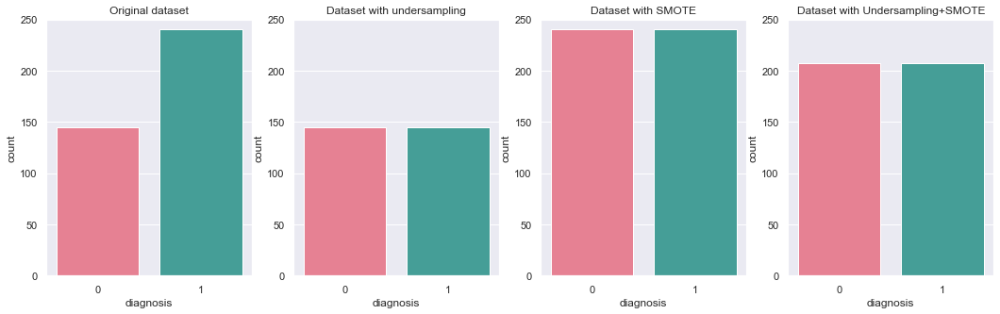

In [51]:
fig, ax = plt.subplots(1, 4, figsize=(18, 5))
titles = ['Original dataset', 'Dataset with undersampling',  'Dataset with SMOTE', 'Dataset with Undersampling+SMOTE']
for i, dataset in enumerate([original_data, X_under, over_data, over_data2]):
    ax[i].set_title(titles[i])
    benign, malignant = dataset.diagnosis.value_counts()
    sns.countplot(x="diagnosis", data=dataset, palette='husl', ax = ax[i])
    ax[i].set_ylim(0, 250)
    

In [52]:
y_train_under = X_under.diagnosis
y_train_over = over_data.diagnosis
X_train_under = X_under.drop('diagnosis', axis=1)
X_train_over = over_data.drop('diagnosis', axis=1)
y_train_uo = over_data2.diagnosis
X_train_uo = over_data2.drop('diagnosis', axis=1)

# Classification algorithms

After all the preliminary phases addressed in the previous sections, now we are ready to perform the classification task. In the following many different classifiers are compared in order to find the one that best suits our analysis. The goodness of each model is evaluated through different metrics that are used to compare the algorithms and make choices during the hyperparameter tuning phase. 

Before the explanation of the different metrics, we first give the following definitions related to the classification task:

* **TRUE POSITIVE**: #elements that belong to the positive class and for which the prediction is right
* **TRUE NEGATIVE**: #elements that belong to the negative class and for which the prediction is right
* **FALSE POSITIVE**: #elements that belong to the negative class but are assigned to the positive one
* **FALSE NEGATIVE**: #elements that belong to the positive class but are assigned to the negative one

The metrics that we consider are the following ones:

* **Accuracy**: it is the proportion of correct predictions over the total number of data classified.

\begin{equation}accuracy = {{TP+TN} \over {TP+TN+FP+FN}}\end{equation}

When the dataset is imbalanced, accuracy scores may be misleading since we could have a high result but the predictions of the minority class could be mostly wrong. Also, there are some cases, for example the one that we are considering in this analysis, in which committing error in the prediction has a different gravity according to the class. 

* **Recall**: proportion of actual positives that was identified correctly. 

\begin{equation}recall = {{TP} \over {TP+FN}}\end{equation}

It is the preferred measure in this case: because not “capturing” even one case of cancer could result in death, the models should place emphasis on the recall score.

* **Precision**: proportion of positive identifications that was actually correct.

\begin{equation}precision = {{TP} \over {TP+FP}}\end{equation}

* **F1-Score**: harmonic average of the previous two.
\begin{equation}f1 = {2 {{rp}\over{r+p}}}\end{equation}

## Cross validation

In order to perform the training and validation of the models, we first performed a split of the dataset into a **train set** and a **test set**. The split is done in such a way that:

* the train set contains the $75\%$ of data and the test set the remaining $25\%$;
* the split is **stratified** thus meaning that the distribution of data is preserved between the splits;
* the split is **shuffled**.

Usually the hyperparameter tuning phase and the evaluation of the performance of the classifier is done by testing the model on the _validation set_ . A classic solution is to split the train set again in two parts: one used for training and the other small one for validation. In this way the better hyperparameters are found by evaluating the model on the validation set and then the final evaluation is done on the test set. However this method is not always a good choice, especially in our case when we don't have a lot of samples at disposal. Splitting the dataset in tree sets means that we train the model on a very reduced number of samples.

To overcome this problem, the **Stratified K-fold cross validation** technique is used, with a number of folds equal to 5. It is a resampling method which consists in repeteadly drawing samples from a training set. It is based on the following procedure:
* the training set is randomly divided into $K$ parts called _folds_ of the same size;
* $k-1$ folds are used to train the model which is then evaluated on the remaining $k$;
* the operation is repeated for each $k=1,...,K$ and each time the validation subset changes;
* in the end, the results are averaged.

During the K-fold cross validation phase, also the dataset balacing techniques are performed. In fact, doing oversampling/undersampling before cross validation is a mistake since there is the risk to put the same sample in both the training and testing folds thus meaning that the algotithms doesn't really evaluate the model's capacity to data that it never saw. For this reason, we use StratifiedKFold and then undersample/oversample all the training folds separately, by only looking at that fold's training data. Then we use all those folds to validate the models.

In [53]:
di.display_html("""
<center><img src="https://scikit-learn.org/stable/_images/grid_search_cross_validation.png" width=500px></center>
""", raw=True)

In [54]:
X_train_sets = [X_train_pca, X_train_under, X_train_over, X_train_uo]
y_train_sets = [y_train, y_train_under, y_train_over, y_train_uo]

In [55]:
titles = ['Original dataset', 'Dataset with undersampling',  'Dataset with SMOTE', 'Dataset undersampling+SMOTE']
def plot_results(cfs, report):
    fig, ax = plt.subplots(2, 4, figsize=(18, 7))
    for i in range(0, 4):
        ax[0][i].set_title(titles[i])
        for j, plot in enumerate(['cf', 'rep']):
            if plot == 'cf':
                sns.heatmap(cfs[i], cmap='Blues',
                                annot=True, 
                                xticklabels=['M', 'B'],  
                                yticklabels=['M', 'B'], ax=ax[j][i])
            else:
                sns.heatmap(pd.DataFrame(report[i]).iloc[:-1, :].T, annot=True, ax=ax[j][i], cmap='Reds_r')


In [56]:
scores = [accuracy_score, precision_score, recall_score, f1_score]
score_names = ['accuracy', 'precision', 'recall', 'f1']
made_scores = [make_scorer(score, pos_label=0, zero_division=0) if score != accuracy_score else make_scorer(score) for score in scores]
metrics = dict(zip(score_names, made_scores))

In [57]:
def fold_grid(pipeline, params, X_train, y_train):
    grid_imba = GridSearchCV(pipeline, param_grid=new_params, cv=kf, scoring=metrics, refit='recall',
                        return_train_score=True)
    grid_imba.fit(X_train, y_train)
    grid_imba.best_params_
    y_pred = grid_imba.predict(X_test)
    recall_score(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    cf_matrix = confusion_matrix(y_test, y_pred, labels=[0, 1])
    report = classification_report(y_test, y_pred, labels=[0, 1], output_dict=True, zero_division=0)
    best_model = grid_imba.best_estimator_
    return cf_matrix, report
    

In [58]:
from itertools import product
cmap="coolwarm"
def plotBoundaries(X, y, clf, name_plots, rows, cols):

    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))

    f, axarr = plt.subplots(len(rows), len(cols), sharex='col', sharey='row', figsize=(30, 20))

    for idx, clf, tt in zip(product(rows, cols),
                            clf,
                            name_plots):
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)

        axarr[idx[0], idx[1]].contourf(xx, yy, Z, alpha=0.4, cmap=cmap)
        axarr[idx[0], idx[1]].scatter(X.iloc[:, 0], X.iloc[:, 1], c=y,
                                      s=20, edgecolor='k', cmap=cmap)
        axarr[idx[0], idx[1]].set_title(tt)
        axarr[idx[0], idx[1]].set_xlabel(dataset.columns[0])
        axarr[idx[0], idx[1]].set_ylabel(dataset.columns[1])

    plt.show()

In [59]:
from matplotlib.colors import ListedColormap
cmap="coolwarm"
def plotSingleBoundary(data, clf, name_plot, ax):
    X = data.drop('diagnosis', axis=1).reset_index(drop=True)
    y = data.diagnosis
    
    clf.fit(X, y)
    
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
    
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    #plt.pcolormesh(xx, yy, Z, cmap=cmap_light, vmin=0, vmax=2)
    #plt.figure()
    ax.contourf(xx, yy, Z, alpha=0.5, cmap=cmap)
    ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cmap, edgecolor='k')
    ax.set_xlabel(dataset.columns[0])
    ax.set_ylabel(dataset.columns[1])
    ax.set_title(name_plot)
    plt.show()

## Decision Tree

The Decision Tree algorithm involves stratifying or segmenting the predictor space into a number of simple regions. It is a predictor, $h : X → Y$, that chooses the label associated with an instance $x$ by traveling from a root node of a tree to a leaf. At each node, the successor child is chosen on the basis of a splitting of the input space according to the best feature following a **greedy approach**. 

The algorithm works as follows:
* The predictor space is divided into $J$ distinct and non-overlapping regions $R1,...,R_j$ which are usually represented as _boxes_ ;
* For every observation that falls into the region $R_j$, the same prediction is done and it is the most commonly occuring class of the observations that lie in that region.

The tree-building process is:
* **top-down**: it starts from the root and recursively split the predictor space;
* **greedy**: each split is node according to a local optimal decision without the certainty of obtaining a global optimum

Among all the possible splits, it is chosen the one that maximizes the so called **gain** that quantifies the improvement due to that split according to different measures. The most important measures used to evaluate the goodness of a split are:

* **Gini index**: a measure of total variance across the $K$ classes. Gini index is a measure of **purity** since a small value indicates that a node contains predominantly observations from a single class. The formula is:

\begin{equation}G = \sum_{k=1}^K \hat p_{mk}(1- \hat p_{mk})\end{equation}

where $\hat p_{mk}$ represents the proportion of training observations in the $m$-th region that are from the $k$-th class.

* **Cross-entropy**: 

\begin{equation}D = -\sum_{k=1}^K \hat p_{mk}log( \hat p_{mk})\end{equation}

We know that Decision Tree classifiers divide the input space into axis-parallel rectangles. We can see this behaviour visualizing the decision boundaries designed by the model during classification. To obtain a graphical representation of the boundaries we use a reduced two-dimensional dataset characterized by the first two principal components that, as seen before, are the most informative ones.

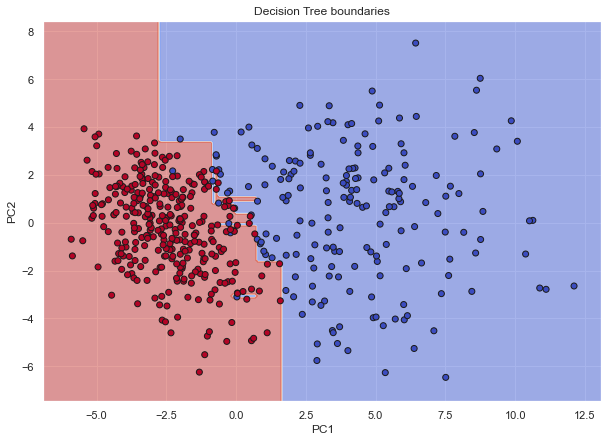

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
plotSingleBoundary(X_2D, DecisionTreeClassifier(), "Decision Tree boundaries", ax)

In the following plots we can visualize the performances of the model with the four datasets created in the previous sections: the original one, the undersampled, the oversampled and the one in which we first applied undersampling and then SMOTE. 

In this case the results are quite high in all the cases and we see slightly improvements with all the balanced datasets, in terms of accuracy but also recall. 

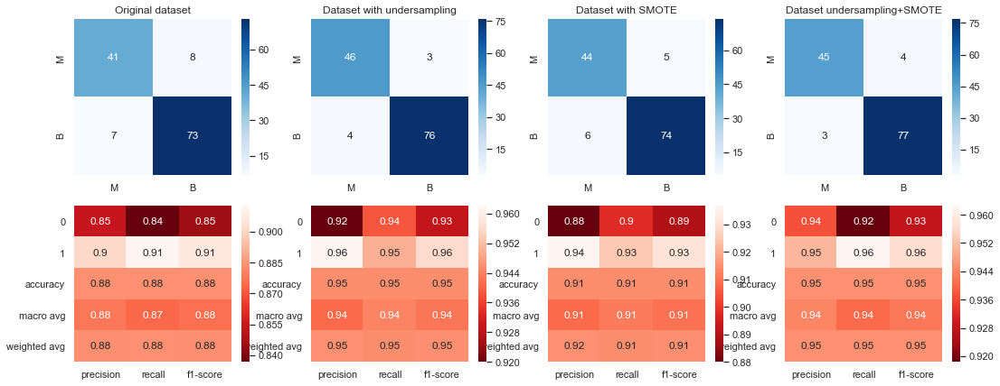

In [61]:
cfs = []
reports = []

params = {
    'criterion': ["gini", "entropy"],
    'splitter': ["best", "random"],
    'max_depth': [None, 1, 3, 5, 8, 10, 12, 15],
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_split': [2, 5, 7, 10, 11, 14, 15]
}

new_params = {'decisiontreeclassifier__' + key: params[key] for key in params}

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

normal_pipeline = make_pipeline(DecisionTreeClassifier())

cf, report = fold_grid(normal_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_pipeline = make_pipeline(RandomUnderSampler(), DecisionTreeClassifier())

cf, report = fold_grid(under_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

over_pipeline = make_pipeline(SMOTE(random_state=42), 
                              DecisionTreeClassifier())

cf, report = fold_grid(over_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_over = make_pipeline(RandomUnderSampler(sampling_strategy=0.7), SMOTE(random_state=42), 
                           DecisionTreeClassifier())
cf, report = fold_grid(under_over, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

plot_results(cfs, reports)

**PROS:**
* Interpretable results
* Can handle numerical and categorical data as well
* Achieve good performance with large data sets

**CONS:**
* Sometimes this model is too simple and doesn't give great results
* Easy to overfit

### Bagging

Bagging is a technique to reduce the variance of a statistical learning method. Since deeper trees are characterized by low bias and high variance, this method is greatly used in this context. 

The idea is related to a theoretical result according to which **averaging a set of observations reduces variance**. Of course we don't have access to multiple training sets, so bagging is the solution of the problem which consists in **sampling with replacement** to obtain different datasets from the original training set. 

The result of bagging consists in $B$ different bootstrapped training sets. Then the model is trained on the $b$-th set to obtain a prediction $\hat f^{(*b)}(x)$ for the point $x$. 
In regression trees, the final prediction is obtained by averaging all the single results from each training set:

\begin{equation}\hat f_{bag}(x) = {1 \over B} \sum_{b=1}^B f^{*b}(x)\end{equation}

For what concerns classification trees, the final prediction is the result of the majority vote of the trees of the forest. 

On average, each bagged tree makes use of around two-thirds of the observations. 
Since we sample with replacement we can have duplicate observations in each bootstrapped set, then each tree will be trained on average on 63.2% of training data.

In [62]:
di.display_html("""
<center><img src="https://miro.medium.com/max/1156/1*4uA23E47rv82m_myCkp6wQ.png" width=700px></center>
""", raw=True)


## Random Forest

Random forests are an ensemble learning methods that make use of a set of uncorrelated decisions trees to construct models that are more robust and less prone to overfitting. They are based on the **bagging method**, but they apply another improvement in order to decorrelate trees. In fact, in addition to taking the random subset of data, random forests also apply a random selection of the features rather than using all the features for each tree. 

Tipically, among $p$ predictors, a random selection of $m = \sqrt p$ is made. 

The performances reached by each dataset are slightly higher than the previous case: this proves that Random Forest classifiers are more efficient than single Decision Trees. 

The best results in terms of accuracy and recall are the ones scored by the first original dataset, even if the recall of the negative class is higher when we balance the dataset.

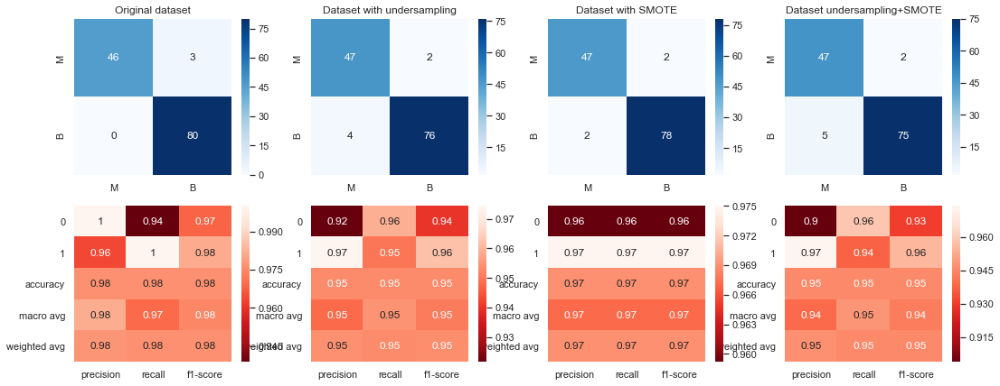

In [63]:
params = {
  "criterion": ["gini", "entropy"],
  "n_estimators": [1, 10, 20, 50, 100],
  "max_depth": [5, 10, 15],
  "max_features": ["auto", "sqrt", "log2"],
  "random_state": [1]
}
cfs = []
reports = []
clf = RandomForestClassifier()

new_params = {'randomforestclassifier__' + key: params[key] for key in params}

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

normal_pipeline = make_pipeline(clf)

cf, report = fold_grid(normal_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_pipeline = make_pipeline(RandomUnderSampler(), clf)

cf, report = fold_grid(under_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

over_pipeline = make_pipeline(SMOTE(random_state=42), clf)

cf, report = fold_grid(over_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_over = make_pipeline(RandomUnderSampler(sampling_strategy=0.7), SMOTE(random_state=42), 
                           clf)
cf, report = fold_grid(under_over, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

plot_results(cfs, reports)

Knowing feature importance indicated by machine learning models can give us high insights on the dataset and on the predictors which are most relevant for the classifier to make predictions. 

The method implemented in _scikit-learn_ to compute feature importances is based on **Gini importance** or **mean decrease impurity**. As said before, the Gini index is a measure of impurity. During the split process, the goal of the split is to create child nodes that have a lower Gini coefficient than the parent node, since we aim at obtaining nodes as pure as possible (in this context, pure means homogeneous). The importance of each feature is evaluated according to this process: we evaluate the mean decrease in Gini that each predictor has realized to understand its contribution.

In the plot belows we show the feature importance on the original dataset (with only the first ten features displayed) and the dataset after the PCA. 

The first plot gives us an idea of the most important feature for classification: _concave points mean_ most of all, followed by the perimeter and the concavity. The second confirms the conclusions reached before, according to which the first two principal components are the most informative ones.

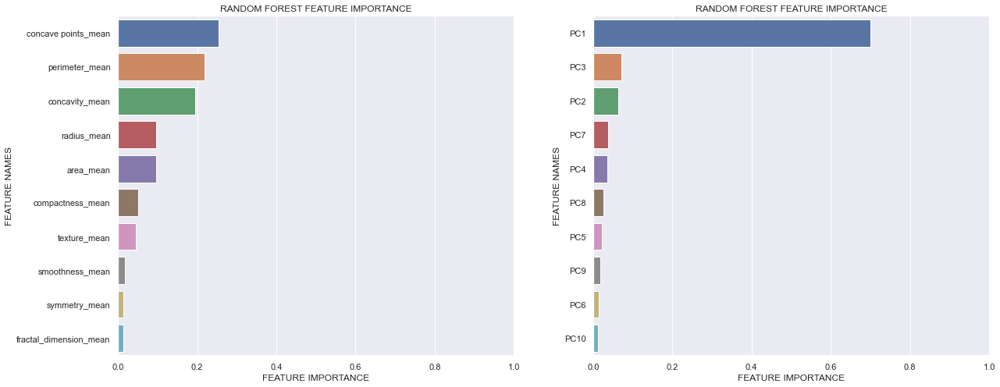

In [64]:
clf = RandomForestClassifier()
data = data_std_if.iloc[:, list(range(10))+[-1]]
X_data = data.drop('diagnosis', axis=1)
y_data = data.diagnosis

def plot_feature_importance(importance,names,model_type, ax):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    #Define size of bar plot
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'], ax=ax)
    #Add chart labels
    ax.set_title(model_type + ' FEATURE IMPORTANCE')
    ax.set_xlabel('FEATURE IMPORTANCE')
    ax.set_ylabel('FEATURE NAMES')
    ax.set_xlim(0, 1)
    
fig, ax = plt.subplots(1, 2, figsize=(20, 8))
datasets_X = [X_data, X_train_sets[0]]
datasets_y = [y_data, y_train_sets[0]]

for i in range(0, 2):
    _ = clf.fit(datasets_X[i], datasets_y[i])
    plot_feature_importance(clf.feature_importances_,datasets_X[i].columns,'RANDOM FOREST', ax[i]) 

## Boosting & AdaBoost

In [65]:
di.display_html("""
<center><img src="https://pluralsight2.imgix.net/guides/81232a78-2e99-4ccc-ba8e-8cd873625fdf_2.jpg" width=600px></center>
""", raw=True)


Boosting is a technique very similar to the bagging method, with the main difference that it does not work in parallel but it is a sequential method. Its goal is to reduce not only variance but also bias in order to manage the bias-complexity tradeoff which consists in finding a tradeoff between the approximation and the estimation error. The idea of boosting is to train weak learners sequentially, each trying to correct its predecessor.

AdaBoost is one of the most important boosting technique whose goal is to combine multiple weak classifiers to build one strong classifier. It takes as input a training set of exemples $S = (x_1, y_1), ..., (x_m, y_m)$ where $y_i = f(x_i)$ and proceeds for $T$ consecutive rounds. 

For each round $t=1,...T$ it defines a distribution $D^{(t)}$ over the set of data. Then it passes the distribution and the set of data to the weak classifier which returns a weak hypothesis whose error $\epsilon_t$ is at most $\frac{1}{2} - \gamma$.

Then, it assigns a weight to this hypothesis equals to $w_t = {{1 \over 2}log({1 \over \epsilon_t}-1})$. This weight is used to update the distribution during the next round, in such a way that data points on which the hypothesis is wrong will get a higher probability mass while examples on which is right will get a lower probability mass. In this way it forces the attention of the weak learner on those samples that make the classification difficult.

The results obtained with this technique are very high and also the recall reaches great values in all the cases. In this situation the undersampled dataset and the one to which we applied undersampling+oversampling are the weakest and return the poorer performances, since the model has probably too few data for learning.

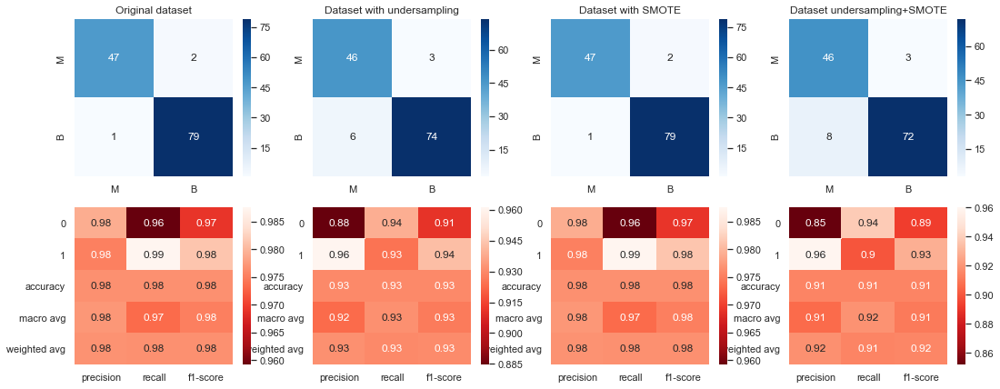

In [66]:
params = {
        "learning_rate":[0.01, 0.05, 0.1, 0.5],
        "n_estimators":[2, 50, 100]

    }
cfs = []
reports = []

clf = AdaBoostClassifier()
new_params = {'adaboostclassifier__' + key: params[key] for key in params}

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

normal_pipeline = make_pipeline(clf)

cf, report = fold_grid(normal_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_pipeline = make_pipeline(RandomUnderSampler(), clf)

cf, report = fold_grid(under_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

over_pipeline = make_pipeline(SMOTE(random_state=42), clf)

cf, report = fold_grid(over_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_over = make_pipeline(RandomUnderSampler(sampling_strategy=0.7), SMOTE(random_state=42), 
                           clf)
cf, report = fold_grid(under_over, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

plot_results(cfs, reports)

## Linear SVM

Support Vector Machine is a supervised algorithm that aims at finding the best hyperplane that separates the training data and maximizes the margin, which is the distance between the hyperplane and the closest points from any class called **support vectors**. 

In [67]:
di.display_html("""
<center><img src="https://upload.wikimedia.org/wikipedia/commons/2/2a/Svm_max_sep_hyperplane_with_margin.png" width=300px></center>
""", raw=True)

### The hard-margin problem

Suppose we have a set of $n$ points $S = (x_1,y_1),...,(x_n,y_n)$, where each $x_i ∈ \mathbb{R}^d$ and $y_i ∈ {±1}$ and assume that the two classes are linearly separable. Consider an hyperplane defined by the equation
\begin{equation} \boldsymbol {w \cdot x}+b = 0 \end{equation} where $\boldsymbol w$ is the vector perpendicular to the hyperplane. 

We can define the following equations for all the points that belongs to the positive and negative (left of the hyperplane) class respectively: 

\begin{equation} \boldsymbol {w \cdot x_i}+b \geq 1 \forall y_i=+1\end{equation} 
\begin{equation} \boldsymbol {w \cdot x_i}+b \leq -1 \forall y_i=-1\end{equation}

Combining the two equations we obtain:

\begin{equation} y_i(\boldsymbol {w \cdot x_i})+b -1 \geq 0\end{equation} 

As we can see in the figure above, the hyperplane sits exactly in the middle of the two parallel hyperplanes that separate the two classes of data and the points that lie on these hyperplanes satisfy the following equations:

\begin{equation} \boldsymbol {w \cdot x_i}+b = 1\end{equation} for the support vectors of the positive class $\boldsymbol x_+$
\begin{equation} \boldsymbol {w \cdot x_i}+b = -1 \end{equation} for the support vectors of the negative class $\boldsymbol x_-$.

We define the distance between the two hyperplanes, so the double of the margin, as:

\begin{equation} (\boldsymbol x_+ - \boldsymbol x_-) \boldsymbol {w \over ||w||} = {(1-b)-(-1-b) \over \boldsymbol {||w||}} = {2 \over \boldsymbol {||w||}} \end{equation}

In this way we can write the following optimization problem:

\begin{equation} max {1 \over \boldsymbol {||w||}} = min {\boldsymbol {||w||}} \end{equation}

Since $L2$ optimization are often more stable than $L1$ we can reformulate the equation as:

\begin{equation} min {\boldsymbol {||w||^2} \over 2} \end{equation}
\begin{equation} s.t. y_i(\boldsymbol {w \cdot x_i})+b -1 \geq 0 \end{equation}
where the constrains forces the hyperplane to correctly classify all the data points. 

Solving this problem through the Lagrange multiplier technique, we obtain a solution that is the weighted linear combination of only the points from the two classes that lie on the margin, so the support vectors. In this sense the classifier needs only to remember this points so it scales well.

The main drawback of this procedure is that in most real situations data are not linearly separable and it is very rare to get all the points correctly classified. For this reason, it is necessary to find a trade-off between the two objectives of the algorithm: **maximize the margin** and **minimize the misclassification rate**.   This  trade-off  is  carried  out  through  the _Soft Margin formulation_  of  the  algorithm that relaxes hard constraints and introduces the hyperparameter $C$ to reach this goal.


### The soft-margin problem

The Soft-margin SVM is a relaxation of the Hard-SVM and it can be applied even if the data are not linearly separable. The idea behind this variation is that we allow the constraint of the previous optimization problem to be violated for some of the examples in the training set. 

To do so, we introduce nonnegative slack variables $\xi_i,...,\xi_n$ that represent the permission to make mistakes and measure how much the previous constraint is violated. 

We can rewrite the optimization problem as.
\begin{equation} \min_{w, b, \xi} ||w||^2 + C \sum_{i = 1}^{n} \xi_i \end{equation}\begin{equation} s.t. ∀i, y_i(⟨w,x_i⟩+b) \ge 1−\xi_i, \xi_i ≥0 \end{equation}

C is a regularization term that represents the cost of misclassification.  When C is small, more mistakes are allowed and misclassifications are given less importance, so it corresponds to a larger margin; when C is large, the cost of misclassification is higher and the margin is smaller and the model depends more on the data thus leading to overfitting.  Small values of C lead to high bias and low variance, while large values lead to low bias but high variance.

In fact the slack variables $\xi_i$ correspond to the Hinge loss:

\begin{equation} l^{hinge}((w, b), (x, y)) = \max \{0, 1 − y(⟨w, x⟩ + b)\}. \end{equation}

In this way we can reformulate the soft margin problem as follows:
\begin{equation} \min ||w||^2 + C L_S^{hinge} (w, b) \end{equation}

where: \begin{equation} L_S^{hinge} (w) = \frac{1}{m} \sum_{i = 1}^m \max\{0, 1 − y_i⟨w, x_i⟩\}\end{equation} is the average  hinge loss over the training sample. 

The plots below show the decision boundaries of the SVM for different values of C. In this case the boundaries are obviously linear since we are using a linear kernel.  For what concerns the hyperparameter, the bigger is C the smaller is the margin, it means that the hyperplane is less distant from the support vectors.  We can observe that lower Cs allow more misclassifications and the area of each label is totally unbalanced.  With very low values of C our classification is completely wrong.

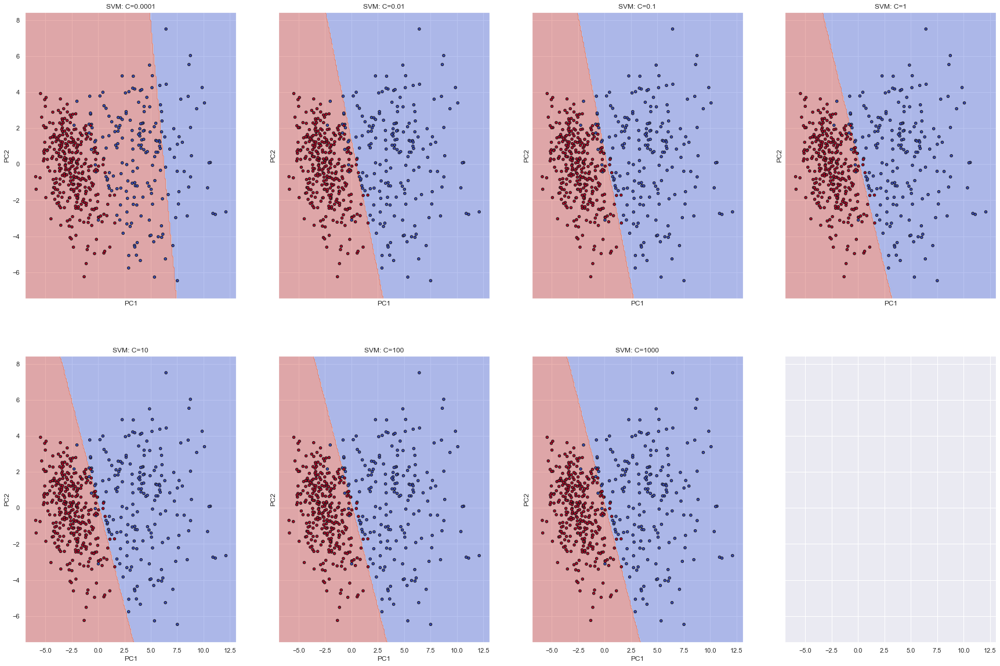

In [68]:
clfs = []
C = [0.0001, 0.01, 0.1, 1, 10, 100, 1000]
X = X_2D.drop('diagnosis', axis=1).reset_index(drop=True)
y = X_2D.diagnosis
for c in C:
    clf = SVC(kernel='linear', C=c)
    clf.fit(X, y)
    clfs.append(clf)
name_plots = ['SVM: C=0.0001', 'SVM: C=0.01', 'SVM: C=0.1', 'SVM: C=1', 'SVM: C=10', 'SVM: C=100', 'SVM: C=1000']
plotBoundaries(X, y, clf=clfs, name_plots=name_plots, rows=[0, 1], cols=[0, 1, 2, 3])

The results below are quite satisfying, comparable with the ones obtained in the previous algorithms.

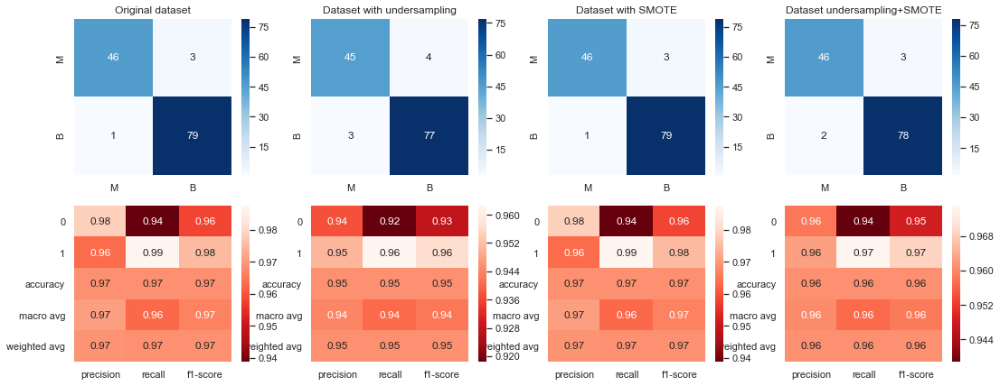

In [70]:
params = {
    'C' : [0.0001, 0.01, 0.1, 1, 10, 100, 1000]
}

clf = SVC(kernel='linear')
cfs = []
reports = []
new_params = {'svc__' + key: params[key] for key in params}

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

normal_pipeline = make_pipeline(clf)
cf, report = fold_grid(normal_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_pipeline = make_pipeline(RandomUnderSampler(), clf)

cf, report = fold_grid(under_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

over_pipeline = make_pipeline(SMOTE(random_state=42), clf)

cf, report = fold_grid(over_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_over = make_pipeline(RandomUnderSampler(sampling_strategy=0.7), SMOTE(random_state=42), 
                           clf)
cf, report = fold_grid(under_over, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

plot_results(cfs, reports)

## SVM with RBF kernel

SVM can be used in linear and non-linear classification tasks. The last situation is handled by means of the **kernel trick**. The idea behind this is that if data are non-linearly separable, they can be mapped in a higher dimensional space where it exists a hyperplane that linearly separates them. Kernel functions are very useful for this mapping since they allow us not to compute exactly the transformation of our data: in fact, we just need to know how to perform inner products in the feature space and we can do it by replacing them with kernel functions.

Given some domain set $X$, it is possible to choose a mapping $\phi : X → \mathbb{R}^n$ and create the image sequence $\hat S = (\phi (x_1), y_1), ..., (\phi (x_m), y_m)$. However, computing linear separators over very high dimensional data may be computationally expensive. The solution to this problem is the kernel trick, which allows to use kernel to compute the inner products between the images of all pairs of data in the feature space (which is the only thing SVM needs).

The kernel function is defined as follows:
\begin{equation} K(x,x′) = ⟨\phi(x),\phi(x′)⟩ \end{equation}

According to the representer theorem, we can write $\boldsymbol w$ as:
\begin{equation} \boldsymbol w = \sum_{j = 1}^m \alpha_j y_i \phi(x_j) \end{equation}

As a consequence:

\begin{equation} ||w||^2 = <\sum_j \alpha_j\phi(x_j),\sum_j \alpha_j\phi(x_j)> \end{equation}
\begin{equation} = \sum_{i,j=1}^n\alpha_i\alpha_j<\phi(x_i), \phi(x_j)>\end{equation}

Osupport vectors correspond to samples that have an alpha value that is greater than zero, so they are the only data useful. We can solve this problem by replacing the inner product with a kernel function.

A symmetric function  $K : X × X → \mathbb{R}$, in order to be a kernel, must follow the **Mercer theorem** according to which the Gram matrix, which is $G$ such that
\begin{equation} G_{i,j} = K(x_i, x_j ) \end{equation}
needs to be **positive semidefinite**. 

There are different kinds of kernels and in this analysis we consider one of the most popular which is the **Radial Basis Function (RBF kernel)**.
It is defined as follows:

\begin{equation} K(x, x') = e^{ -\gamma||x-x'||^2}\end{equation}

Also in this case we can visualize the decision boundaries for different values of $C$ and $\gamma$. 
We  can  see  how,  as  C  grows,  the  classifier  becomes  more  intolerant  to  misclassification  and decision boundaries are highly effected by individual data points. The extreme case is when C is very high and the model tends to overfit since misclassification has a big cost. As we said before, large values of C imply low bias and high variance, while small values of C leads to low variance and high bias.

The $\gamma$ parameter defines the distance of influence of each training sample:  if it has low values then every point has a far reach, otherwise it has a close reach.  This means that if we have high values of the parameter then the boundaries are dependent on the closest points (support vectors), while for small values of $\gamma$ even points at greater distance are considered in the choice of the hyperplanes.

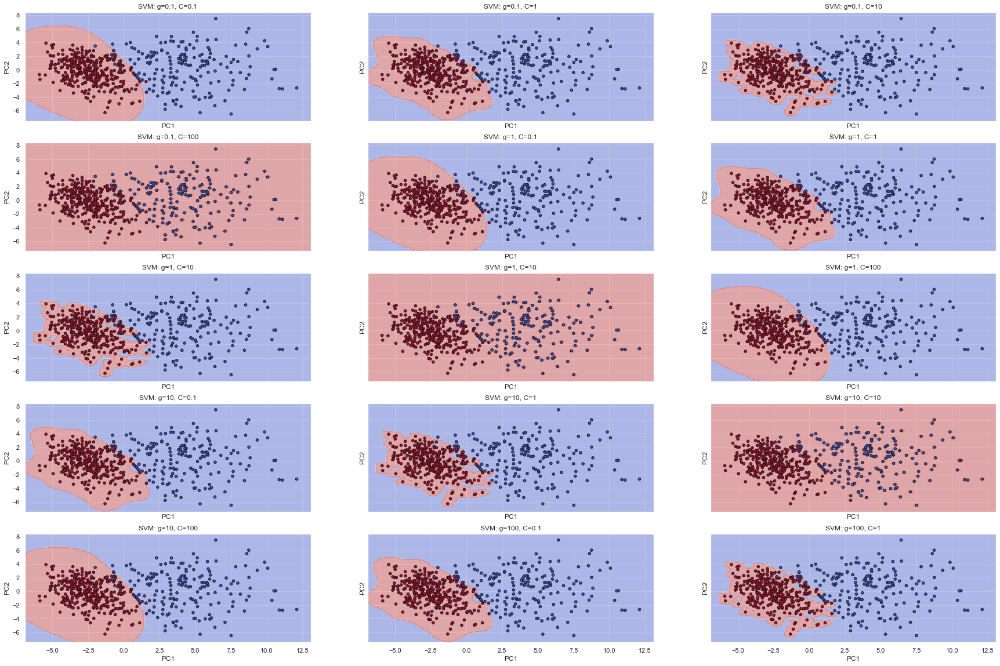

In [71]:
C = [0.1, 1, 10, 100]
gamma = [0.1, 1, 10, 100]
X = X_2D.drop('diagnosis', axis=1).reset_index(drop=True)
y = X_2D.diagnosis
clfs = []
for g in gamma:
    for c in C:
        clf = SVC(kernel='rbf', C=c, gamma=c)
        clf.fit(X, y)
        clfs.append(clf)
name_plots = ['SVM: g=0.1, C=0.1', 'SVM: g=0.1, C=1', 'SVM: g=0.1, C=10', 'SVM: g=0.1, C=100',
            'SVM: g=1, C=0.1', 'SVM: g=1, C=1', 'SVM: g=1, C=10', 'SVM: g=1, C=10', 'SVM: g=1, C=100',
            'SVM: g=10, C=0.1', 'SVM: g=10, C=1', 'SVM: g=10, C=10', 'SVM: g=10, C=100',
            'SVM: g=100, C=0.1', 'SVM: g=100, C=1', 'SVM: g=100, C=10', 'SVM: g=100, C=100']

plotBoundaries(X, y, clf=clfs, name_plots=name_plots, rows=[0, 1, 2, 3, 4], cols=[0, 1, 2])

In this case we have very strange results, since for the second dataset are very small and there are a lot of misclassifications, since almost all the points are assigned to one class. This could be a consequence of a wrong algorithm or set of hyperparameters.

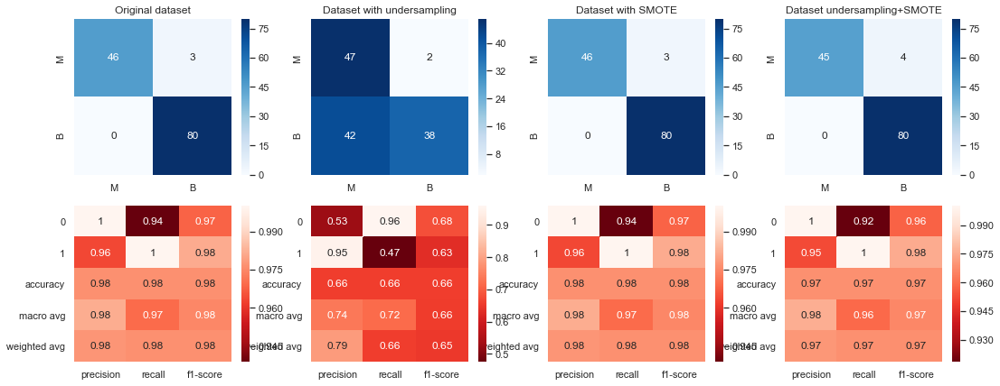

In [72]:
params = {
    'C' : [0.0001, 0.01, 0.1, 1, 10, 100, 1000],
    'gamma': [0.001,0.01,0.1,1,10,100,1000]
}
clf = SVC(kernel='rbf')
cfs = []
reports = []
new_params = {'svc__' + key: params[key] for key in params}

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

normal_pipeline = make_pipeline(clf)
cf, report = fold_grid(normal_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_pipeline = make_pipeline(RandomUnderSampler(), clf)

cf, report = fold_grid(under_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

over_pipeline = make_pipeline(SMOTE(random_state=42), clf)

cf, report = fold_grid(over_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_over = make_pipeline(RandomUnderSampler(sampling_strategy=0.7), SMOTE(random_state=42), 
                           clf)
cf, report = fold_grid(under_over, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

plot_results(cfs, reports)

**PROS:**
* It is very adaptable to different kind of problems thanks to the kernel trick
* It is memory efficient
* It is resilient to outliers
* It works well in high-dimensional space
* Best algorithm when classes are linearly separable

**CONS:**
* Long training phase:  if  we  add  new  data  to  the  train  set,  the  training  phase  needs  to  be redone
* A wrong kernel choice could lead to bad results and the choice of the appropriate kernel function can be tricky
* Slow and requires a hyperparameter tuning phase

## Logistic Regression

In [73]:
di.display_html("""
<center><img src="https://miro.medium.com/max/1091/1*zFM1ajUSh2r_sG8dQGkkeA.gif" width=500px></center>
""", raw=True)

Logistic regression is a Generalized Linear Model used for classification tasks which squashes the regression line into a S-shaped curve between $0$ and $1$. To do so, a special non-linear function called **sigmoid** is applied to the output value of a linear regression model. 

The sigmoid function is defined as follows:

\begin{equation} \sigma(x) = \frac{1}{1 + \exp{(-x)}} \end{equation}

Defining $p$ as the conditional probability that $x$ belongs to class $1$ having seen the data $x$, logistic regression applies the following equation to assign a label to a sample:

\begin{equation}p(X) = P(Y=1|X) = {{e^{\beta_0+\beta_1X}} \over {1+e^{\beta_0+\beta_1X}}}\end{equation}

The goal of the learning is to estimate the parameters $\beta_0$ and $\beta_1$ in such a way that the likelihood of predicting the given class on the seen samples is maximized. We transform the equation above by applying the **logit function** to $p(X)$:

\begin{equation}{log{p(X) \over {1-p(X)}}} = \beta_0+\beta_1X \end{equation}

Then we perform maximum likelihood estimation to obtain an estimation of the parameters:

\begin{equation} L(\beta_0, \beta) = \prod_{i:y_i=1}p(x_i) \prod_{i:y_i=0}(1-p(x_i))  \end{equation}

Also in the cost function a new parameter called C is introduced: this is the inverse of regularization, thus meaning that smaller values imply stronger regularization. 

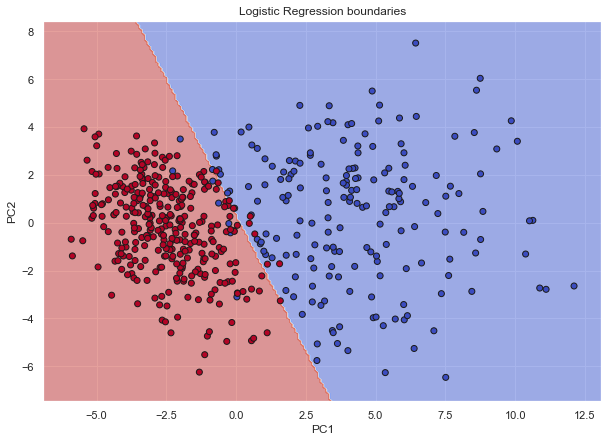

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
plotSingleBoundary(X_2D, LogisticRegression(), "Logistic Regression boundaries", ax)

Also in this case we can see the results reached with the use of the four different datasets. We don't have many differences in performances but all the results are quite good in terms of accuracy, recall and precision.

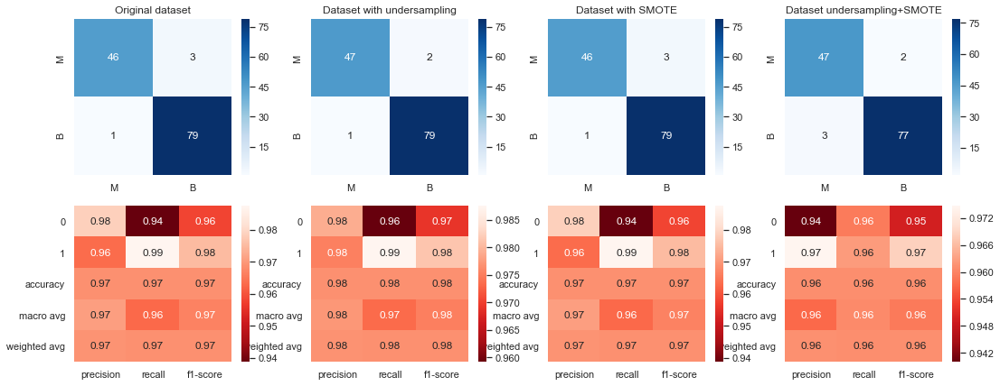

In [75]:
params = {
    "C": [.01, .1, 1, 10, 100],
}
clf = LogisticRegression()
cfs = []
reports = []
new_params = {'logisticregression__' + key: params[key] for key in params}

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

normal_pipeline = make_pipeline(clf)
cf, report = fold_grid(normal_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_pipeline = make_pipeline(RandomUnderSampler(), clf)

cf, report = fold_grid(under_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

over_pipeline = make_pipeline(SMOTE(random_state=42), clf)

cf, report = fold_grid(over_pipeline, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

under_over = make_pipeline(RandomUnderSampler(sampling_strategy=0.7), SMOTE(random_state=42), 
                           clf)
cf, report = fold_grid(under_over, new_params, X_train, y_train)
cfs.append(cf)
reports.append(report)

plot_results(cfs, reports)

# Conclusions

In this work we analyzed a health dataset and we understood the data analysis pipeline that is necessary to follow in order to guarantee a correct analysis of data. During the first phase of our study we underlined different problematics of our data, such as:
* correlation among features
* presence of outliers
* unbalanced dataset

We gave different solutions to these problems comparing the different results. Also we used many Machine Learning algorithms to perform the classification task. We remember that each model is characterized by a set of hyperparameters and, in order to work properly, a preliminary tuning of these hyperparameters is required. We studied the strengthness and weakness of each algorithm analyzing the different results and giving more importance to the recall metric which is the one that should be optimized in healthcare situations. 